# **Forecasting the amount of CO2 emitted by countries over the years"**

**Note**: In this notebook, we use almost *scikit-learn 1.2.2*, a version which is updated and available on our computer. However, in the final section, **2.5. Data Imputation**, we need an older version, *scikit-learn 1.1.2* for compatibility with *missingpy 0.2.0*.

# **1. Exploratory data analysis**

### **MODULE IMPORT**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_theme(style='darkgrid', palette='colorblind')
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

### **DATA IMPORT**

In [2]:
path = 'https://raw.githubusercontent.com/holeltomhum/Projet_machine_learning/main/data/'
df = pd.read_csv(path + 'global_data_on_sustainable_energy.csv')
df.head()

,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable-electricity-generating-capacity-per-capita,Financial flows to developing countries (US $),Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),...,Primary energy consumption per capita (kWh/person),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Value_co2_emissions_kt_by_country,Renewables (% equivalent primary energy),gdp_growth,gdp_per_capita,Density\n(P/Km2),Land Area(Km2),Latitude,Longitude
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,...,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,...,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,...,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,...,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,...,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953


## **1.1. DATA PREPARING**

Refining data processing to generate a cleaner and improved dataset for enhanced machine learning outcomes.<br>

Performing below steps:<br>
1. <b>COLUMN RENAMING</b>  - Rewriting column names to create more meaningful and concise labels.<br>
2. <b>COLUMN REMOVER</b>    - Removing un-necessary columns.<br>
3. <b>COLUMN DATATYPE</b>  - Converting column types to suitable data types for enhanced operational efficiency.<br>
4. <b>COLUMN NULL</b>    - Removing columns with hight percentage of null, NaN, or None values if we do not impute.<br>
5. <b>DATA NULL</b>    - Removing all samples with null, NaN, or None values if we do not impute.<br>
6. <b>DATA DUPLICATION</b> - Checking data duplications.<br>
7. <b>DATA IMPUTATION</b>  - Imputing null, NaN, or None values by appropriate replacement values (at the last section of this project).<br>

In [3]:
df.rename(columns={'Entity':'country_name',
                    'Year':'reported_year',
                    'Access to electricity (% of population)':'population_with_electricity_percentage',
                    'Access to clean fuels for cooking':'population_with_clean_cooking_fuel_percentage',
                    'Renewable-electricity-generating-capacity-per-capita':'renewable_electricity_generate_per_capita',
                    'Financial flows to developing countries (US $)':'foreign_aid_dollar',
                    'Renewable energy share in the total final energy consumption (%)':'renewable_percentage_in_total_consumption',
                    'Electricity from fossil fuels (TWh)':'fossil_electricity_generate_per_hour',
                    'Electricity from nuclear (TWh)':'nuclear_electricity_generate_per_hour',
                    'Electricity from renewables (TWh)':'renewable_electricity_generate_per_hour',
                    'Low-carbon electricity (% electricity)':'decarbonized_electricity_percentage',
                    'Primary energy consumption per capita (kWh/person)':'energy_consumption_per_capita',
                    'Energy intensity level of primary energy (MJ/$2017 PPP GDP)':'energy_consumption_per_gdp',
                    'Value_co2_emissions_kt_by_country':'co2_by_country',
                    'Renewables (% equivalent primary energy)':'renewable_percentage',
                    'gdp_growth':'gdp_growth',
                    'gdp_per_capita':'gdp_per_capita',
                    'Density\\n(P/Km2)':'population_density',
                    'Land Area(Km2)':'country_area',
                    'Latitude':'country_latitude',
                    'Longitude':'country_longitude'}, inplace=True)

df.head()

,country_name,reported_year,population_with_electricity_percentage,population_with_clean_cooking_fuel_percentage,renewable_electricity_generate_per_capita,foreign_aid_dollar,renewable_percentage_in_total_consumption,fossil_electricity_generate_per_hour,nuclear_electricity_generate_per_hour,renewable_electricity_generate_per_hour,...,energy_consumption_per_capita,energy_consumption_per_gdp,co2_by_country,renewable_percentage,gdp_growth,gdp_per_capita,population_density,country_area,country_latitude,country_longitude
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,...,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,...,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,...,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,...,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,...,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953


In [4]:
df.drop(columns='fossil_electricity_generate_per_hour', inplace=True) # For pedagogic purpose

In [5]:
df.dtypes

country_name                                      object
reported_year                                      int64
population_with_electricity_percentage           float64
population_with_clean_cooking_fuel_percentage    float64
renewable_electricity_generate_per_capita        float64
foreign_aid_dollar                               float64
renewable_percentage_in_total_consumption        float64
nuclear_electricity_generate_per_hour            float64
renewable_electricity_generate_per_hour          float64
decarbonized_electricity_percentage              float64
energy_consumption_per_capita                    float64
energy_consumption_per_gdp                       float64
co2_by_country                                   float64
renewable_percentage                             float64
gdp_growth                                       float64
gdp_per_capita                                   float64
population_density                                object
country_area                   

In this case, the years follow a sequential order from 2000 to 2020. Therefore, "Year" can be considered a categorical variable with order. This means that the years are not merely labels but represent a progression in time, with each year having a logical and sequential relationship to the previous and subsequent years.

In [6]:
df['country_name']=pd.Categorical(df['country_name'],ordered=False)
df['reported_year']=pd.Categorical(df['reported_year'],ordered=True)
df['population_density']=pd.to_numeric(df['population_density'].str.replace(',', ''), errors='coerce')
df.dtypes

country_name                                     category
reported_year                                    category
population_with_electricity_percentage            float64
population_with_clean_cooking_fuel_percentage     float64
renewable_electricity_generate_per_capita         float64
foreign_aid_dollar                                float64
renewable_percentage_in_total_consumption         float64
nuclear_electricity_generate_per_hour             float64
renewable_electricity_generate_per_hour           float64
decarbonized_electricity_percentage               float64
energy_consumption_per_capita                     float64
energy_consumption_per_gdp                        float64
co2_by_country                                    float64
renewable_percentage                              float64
gdp_growth                                        float64
gdp_per_capita                                    float64
population_density                                float64
country_area  

<Axes: >

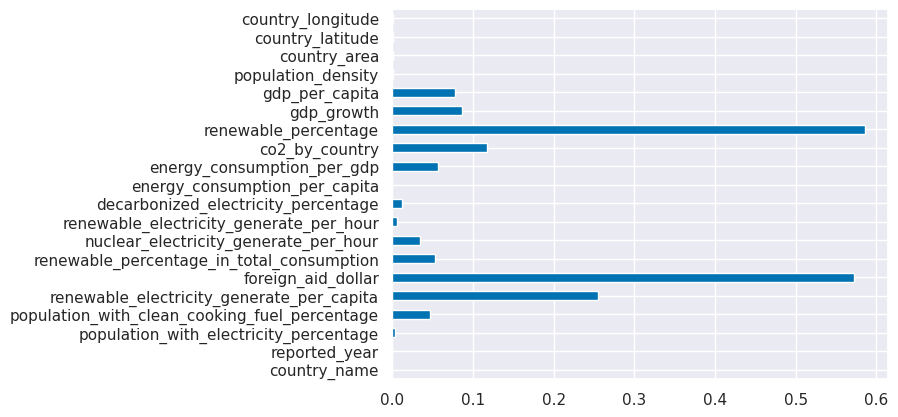

In [7]:
missing_rates = df.isna().mean()
missing_rates.plot(kind='barh')

In [8]:
# Drop columns with missing values exceeding 25%
df.drop(columns=df.columns[missing_rates > 0.25], inplace = True)

In [9]:
df_raw = df.copy() # essential for imputation after

In [10]:
df.dropna(inplace=True) # Delete all individuals which have missing values

In [11]:
df.duplicated().sum()

0

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2868 entries, 3 to 3647
Data columns (total 17 columns):
 #   Column                                         Non-Null Count  Dtype   
---  ------                                         --------------  -----   
 0   country_name                                   2868 non-null   category
 1   reported_year                                  2868 non-null   category
 2   population_with_electricity_percentage         2868 non-null   float64 
 3   population_with_clean_cooking_fuel_percentage  2868 non-null   float64 
 4   renewable_percentage_in_total_consumption      2868 non-null   float64 
 5   nuclear_electricity_generate_per_hour          2868 non-null   float64 
 6   renewable_electricity_generate_per_hour        2868 non-null   float64 
 7   decarbonized_electricity_percentage            2868 non-null   float64 
 8   energy_consumption_per_capita                  2868 non-null   float64 
 9   energy_consumption_per_gdp                    

In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
population_with_electricity_percentage,2868.0,76.584630,3.151037e+01,1.252269,53.237811,97.000000,100.000000,1.000000e+02
population_with_clean_cooking_fuel_percentage,2868.0,62.170084,3.923855e+01,0.000000,22.075000,81.550000,100.000000,1.000000e+02
renewable_percentage_in_total_consumption,2868.0,35.802071,3.002400e+01,0.000000,9.187500,28.790000,60.667500,9.604000e+01
nuclear_electricity_generate_per_hour,2868.0,15.337019,7.877607e+01,0.000000,0.000000,0.000000,0.000000,8.094100e+02
renewable_electricity_generate_per_hour,2868.0,26.603375,1.076403e+02,0.000000,0.090000,1.680000,10.102500,2.014570e+03
decarbonized_electricity_percentage,2868.0,39.629403,3.445488e+01,0.000000,6.091074,35.009718,66.879318,1.000000e+02
energy_consumption_per_capita,2868.0,26082.456843,3.709746e+04,105.110120,2779.966525,11922.761000,31838.556000,2.625857e+05
energy_consumption_per_gdp,2868.0,5.418111,3.577415e+00,1.030000,3.280000,4.400000,6.140000,3.257000e+01
co2_by_country,2868.0,168818.218105,8.180202e+05,30.000000,2187.500060,10424.999715,58145.000460,1.070722e+07
gdp_growth,2868.0,3.895326,4.645613e+00,-36.658153,1.770575,3.788166,5.957490,6.337988e+01


In [14]:
# Resetting the index to a sequential range
df.reset_index(drop=True, inplace=True)
df.tail()

,country_name,reported_year,population_with_electricity_percentage,population_with_clean_cooking_fuel_percentage,renewable_percentage_in_total_consumption,nuclear_electricity_generate_per_hour,renewable_electricity_generate_per_hour,decarbonized_electricity_percentage,energy_consumption_per_capita,energy_consumption_per_gdp,co2_by_country,gdp_growth,gdp_per_capita,population_density,country_area,country_latitude,country_longitude
2863,Zimbabwe,2015,33.700000,29.5,80.82,0.0,5.37,57.188496,3860.9202,10.36,12430.00031,1.779873,1445.069702,38.0,390757.0,-19.015438,29.154857
2864,Zimbabwe,2016,42.561730,29.8,81.90,0.0,3.32,48.680350,3227.6802,10.00,11020.00046,0.755869,1464.588957,38.0,390757.0,-19.015438,29.154857
2865,Zimbabwe,2017,44.178635,29.8,82.46,0.0,4.30,58.503407,3068.0115,9.51,10340.00015,4.709492,1235.189032,38.0,390757.0,-19.015438,29.154857
2866,Zimbabwe,2018,45.572647,29.9,80.23,0.0,5.46,59.412407,3441.9858,9.83,12380.00011,4.824211,1254.642265,38.0,390757.0,-19.015438,29.154857
2867,Zimbabwe,2019,46.781475,30.1,81.50,0.0,4.58,55.582527,3003.6553,10.47,11760.00023,-6.144236,1316.740657,38.0,390757.0,-19.015438,29.154857


## **1.2. Unidimensional Statistics**

Kernel density estimation (KDE) in seaborn's histplot function, is an optional parameter that controls whether to overlay a kernel density estimate on top of the histogram.

Kernel density estimation is a non-parametric way to estimate the probability density function of a random variable. It works by placing a kernel (a smooth, symmetric function, such as a Gaussian) at each data point and summing up the contributions from all kernels to estimate the density at any given point.

When **'kde=True'**, seaborn will estimate the kernel density of the data and plot it as a smooth curve over the histogram bars. This curve represents a smoothed version of the underlying distribution of the data.

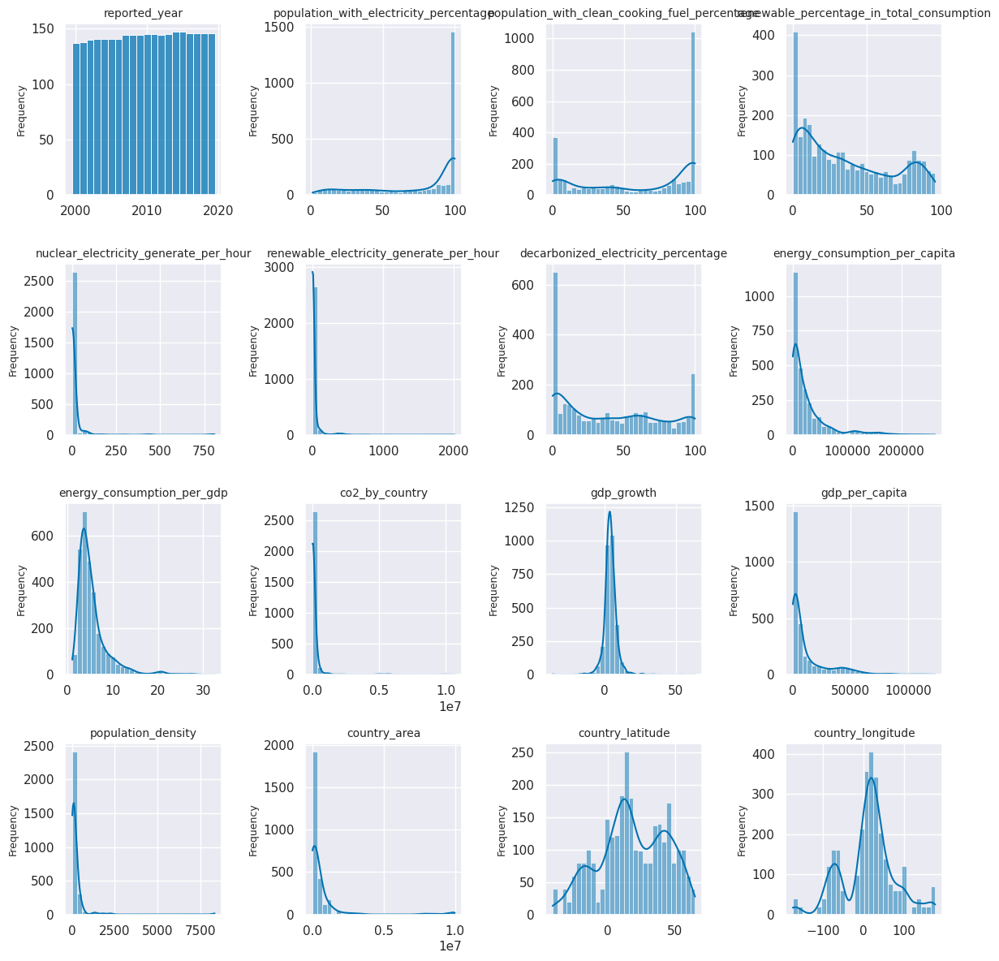

In [15]:
# Filter out the quantitative variables
quantitative_variables = df.select_dtypes(include=['float64']).columns

# Create subplots
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

# Iterate over each quantitative variable and create individual plots
for i, column in enumerate(df.columns[1:]):
    if column in quantitative_variables:
        sns.histplot(data=df[column], bins = 30, kde=True, ax=axes[i])
    else:
        sns.histplot(data=df[column], ax=axes[i])
    axes[i].set_title(column, fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=9)
    axes[i].set_xlabel(None)

# Adjust layout
plt.tight_layout()
plt.show()

For most of the variables, which are right-skewed, a logarithmic transformation is often a good choice. However, since logarithms cannot handle zero or negative values, we must account for this before applying the transformation. In cases where the minimum value is zero, we might add a small constant to all values. For variables that already have a roughly normal distribution or are categorical (like gdp_growth), we may not need to apply any transformation.

Transformations are proposed to make certain distributions more symmetrical and thus more “Gaussian”. This is necessary for certain future modeling methods (linear), not for all (trees).

In [16]:
df_transformed = df.copy()

# List of variables to transform
variables_to_transform = [
    'population_with_electricity_percentage',
    'population_with_clean_cooking_fuel_percentage',
    'nuclear_electricity_generate_per_hour',
    'renewable_electricity_generate_per_hour',
    'energy_consumption_per_capita',
    'energy_consumption_per_gdp',
    'co2_by_country',
    'gdp_per_capita',
    'population_density',
    'country_area'
]

# Apply log transformation to the right-skewed variables
# Adding a small constant (1) to avoid log(0)
for variable in variables_to_transform:
    if variable.endswith('percentage'):
        df_transformed[f'log_{variable}'] = (df_transformed[variable]).map(lambda x: np.log(100-x+0.1))
    else:
        df_transformed[f'log_{variable}'] = (df_transformed[variable]).map(lambda x: np.log(x+1))
    # Drop the original variable
    if variable != 'co2_by_country':
        df_transformed.drop(columns=variable, inplace=True)

df_transformed.head()

,country_name,reported_year,renewable_percentage_in_total_consumption,decarbonized_electricity_percentage,co2_by_country,gdp_growth,country_latitude,country_longitude,log_population_with_electricity_percentage,log_population_with_clean_cooking_fuel_percentage,log_nuclear_electricity_generate_per_hour,log_renewable_electricity_generate_per_hour,log_energy_consumption_per_capita,log_energy_consumption_per_gdp,log_co2_by_country,log_gdp_per_capita,log_population_density,log_country_area
0,Afghanistan,2003,36.66,67.021280,1220.000029,8.832278,33.93911,67.709953,4.446895,4.506454,0.0,0.488580,5.442280,0.875469,7.107425,5.255847,4.110874,13.388154
1,Afghanistan,2004,44.24,62.921350,1029.999971,1.414118,33.93911,67.709953,4.382464,4.490881,0.0,0.444686,5.324137,0.788457,6.938284,5.358387,4.110874,13.388154
2,Afghanistan,2005,33.88,63.440857,1549.999952,11.229715,33.93911,67.709953,4.313602,4.476200,0.0,0.463734,5.533663,0.879627,7.346655,5.493190,4.110874,13.388154
3,Afghanistan,2006,31.89,76.190475,1759.999990,5.357403,33.93911,67.709953,4.239618,4.457250,0.0,0.494696,5.721691,0.916291,7.473637,5.578724,4.110874,13.388154
4,Afghanistan,2007,28.78,78.947370,1769.999981,13.826320,33.93911,67.709953,4.159648,4.440296,0.0,0.559616,5.872906,0.928219,7.479300,5.888028,4.110874,13.388154


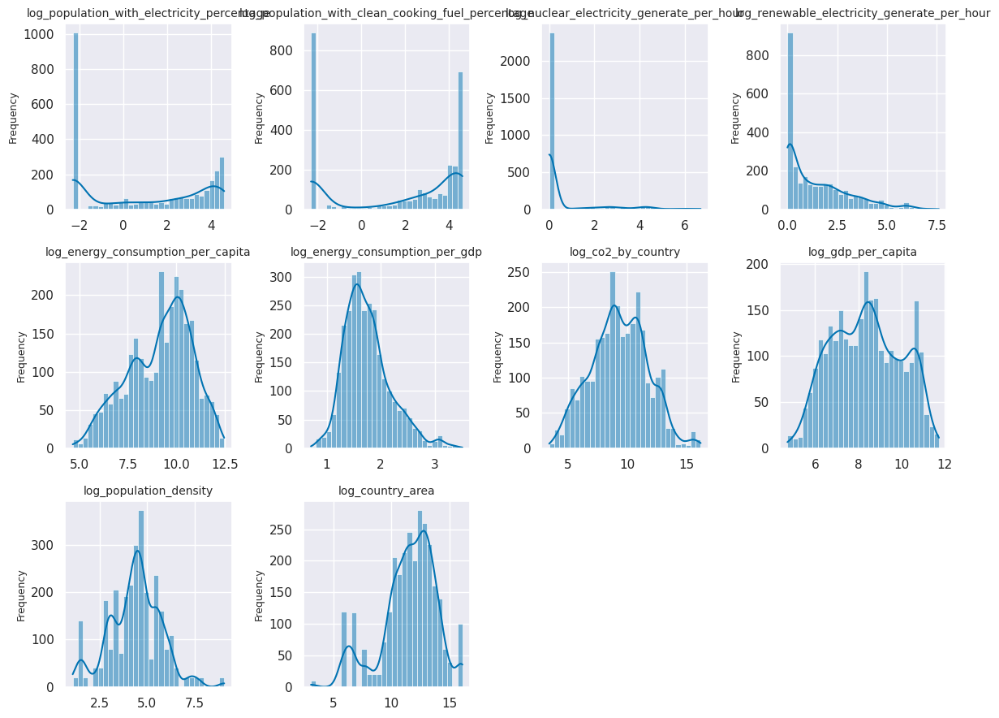

In [17]:
fig, axes = plt.subplots(3, 4, figsize=(12, 9))
axes = axes.flatten()

for i, column in enumerate(variables_to_transform):
    sns.histplot(data=df_transformed[f'log_{column}'], bins = 30, kde=True, ax=axes[i])
    axes[i].set_title(f'log_{column}',fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=9)
    axes[i].set_xlabel('')
    axes[i].set_xlabel(None)

# Adjust layout
axes[-1].set_visible(False)
axes[-2].set_visible(False)
plt.tight_layout()
plt.show()

Looking at the histograms of the log-transformed variables, the distributions seem to have improved in terms of symmetry. Log transformations have a way of making right-skewed distributions appear more normal, which is beneficial for many statistical models that assume normally distributed inputs.

From the histograms, we have some observations:

1. The **log transformations** have generally helped to centralize the data and reduce skewness, as evidenced by the shapes that are more bell-like than the original distributions.

2. For variables such as `log_co2_per_capita` and `log_per_capita_power`, the log transformation has significantly reduced the right skewness, leading to a more symmetric distribution.

3. Despite the transformation, some variables like `log_nuclear_power_generate_per_hour` and `log_renewable_power_generate_per_hour` still show a concentration of values at the lower end, indicating that these variables have a lot of zero or near-zero values.

4. The variable `log_population_density` shows multiple peaks. This could indicate the presence of subgroups within the data, which represent different population distribution patterns (urban vs. rural, for instance).

5. Some distributions, like `log_country_area`, still have outliers as evidenced by the long tails.

## **1.3. Heterogeneity of $CO_{2}$ emissions between countries**

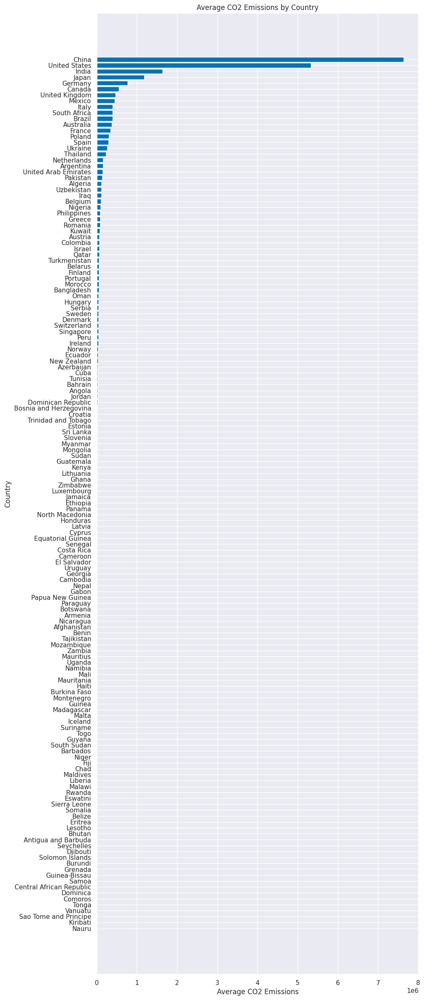

In [18]:
# Calculate the average value of CO2 emissions for each country
avg_co2_by_country = df_transformed.groupby('country_name', observed=True)['co2_by_country'].mean().sort_values(ascending=False)

# Visualize using horizontal bar plot with data arranged from high to low
plt.figure(figsize=(10, 30))
plt.barh(avg_co2_by_country.index, avg_co2_by_country.values)
plt.title('Average CO2 Emissions by Country')
plt.xlabel('Average CO2 Emissions')
plt.ylabel('Country')
plt.gca().invert_yaxis()  # Invert the y-axis to have high values at the top
plt.show()

country_name
China            7.636642e+06
United States    5.329539e+06
India            1.633979e+06
Japan            1.183734e+06
Germany          7.736445e+05
Name: co2_by_country, dtype: float64


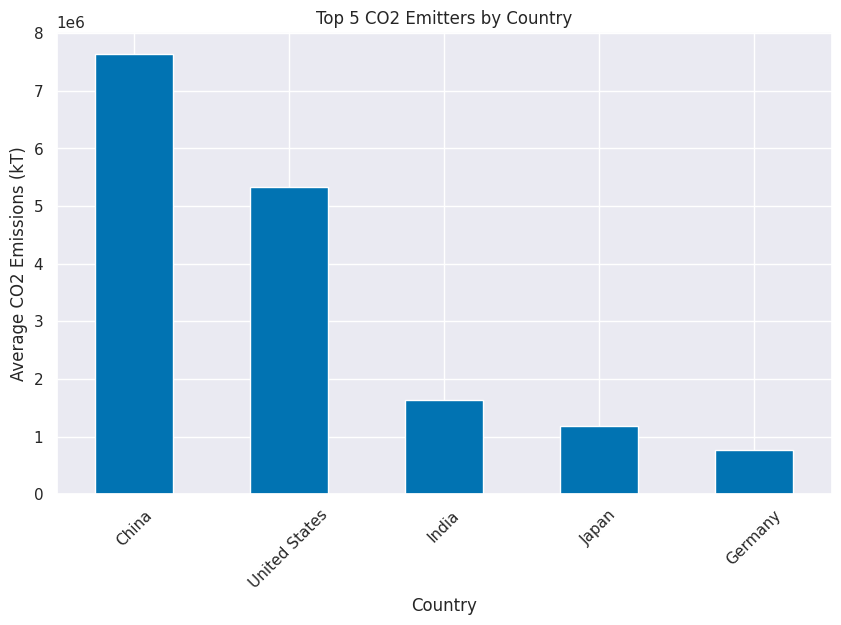

In [19]:
# Take out the 5 countries with the highest average emissions
top_5_co2_emitters = avg_co2_by_country.head(5)
print(top_5_co2_emitters)

# Visualize
plt.figure(figsize=(10, 6))
top_5_co2_emitters.plot(kind='bar')
plt.title('Top 5 CO2 Emitters by Country')
plt.ylabel('Average CO2 Emissions (kT)')
plt.xlabel('Country')
plt.xticks(rotation=45)
plt.show()

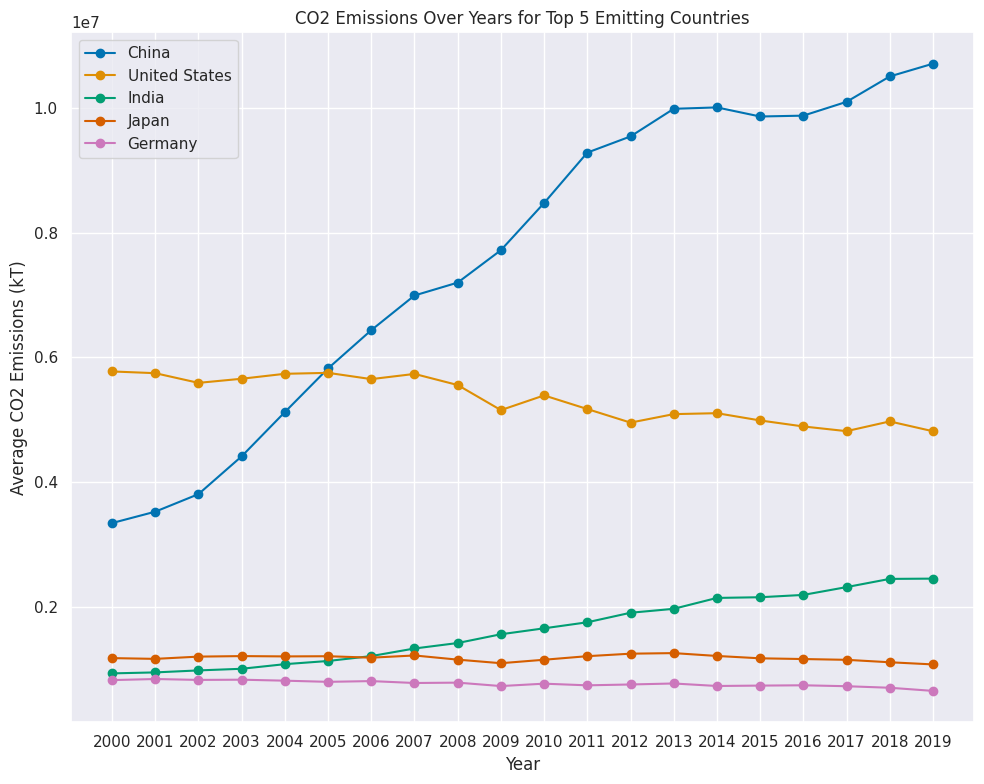

In [20]:
plt.figure(figsize=(10,8))

for country in top_5_co2_emitters.index:
    country_data = df[df['country_name'] == country]
    plt.plot(country_data['reported_year'], country_data['co2_by_country'], label=country, marker = 'o')

plt.title('CO2 Emissions Over Years for Top 5 Emitting Countries')
plt.xlabel('Year')
plt.xticks(df['reported_year'].unique())
plt.ylabel('Average CO2 Emissions (kT)')
plt.legend()
plt.tight_layout()
plt.show()

## **1.4. Bidimensional Statistics**

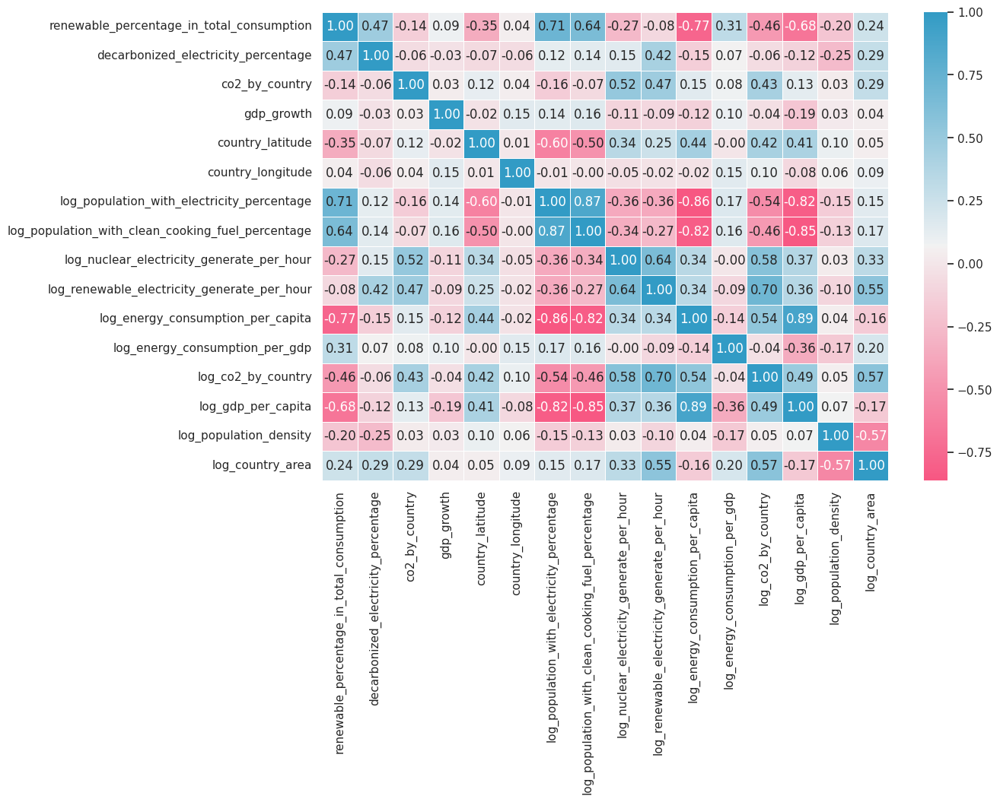

In [21]:
quantitative_variables = df_transformed.select_dtypes(include=['float64']).columns
plt.figure(figsize=(12,8))
# correlation between columns
corr_matrix = df_transformed[quantitative_variables].corr()
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap=cmap, linewidths=.5)
plt.xticks(rotation=90)

plt.show()

**Analysis of Correlations**

The correlation matrix reveals that after log-transformation, the relationships between variables become clearer, with both high and low correlations. There are strong correlations between variables related to energy consumption, economic factors and environmental indicators:

- **High Positive Correlations**

  - **`log_population_with_electricity_percentage` and `log_population_with_clean_cooking_fuel_percentage` (0.85)**: This high correlation indicates that as the percentage of the population with electricity increases, the percentage with clean cooking fuel also increases, reflecting improved infrastructure and living conditions.
  
  - **`log_energy_consumption_per_capita` and `log_energy_consumption_per_gdp` (0.70)**: This strong correlation shows that energy consumption per capita and energy consumption per GDP unit often go hand in hand, indicating a close relationship between economic development and energy consumption.

- **Low Correlations**

  - **`country_latitude` and `log_nuclear_electricity_generate_per_hour` (-0.03)**: The very low correlation suggests no significant linear relationship between geographic latitude and nuclear power production.

  - **`country_longitude` and `log_gdp_per_capita` (0.06)**: This low correlation indicates that economic factors are not simply explained by geographic longitude.

- **Large Negative Correlations**

  - **`log_energy_consumption_per_capita` and `renewable_percentage_in_total_consumption` (-0.77)**: This high negative correlation indicates that as the percentage of renewable energy in total consumption increases, the energy consumption per capita decreases, possibly reflecting a shift towards renewable energy sources.

  - **`log_population_with_clean_cooking_fuel_percentage` and `log_energy_consumption_per_capita` (-0.85)**: This large negative correlation shows that countries with a higher percentage of the population using clean cooking fuel tend to have lower energy consumption per capita, likely due to higher energy efficiency and advanced infrastructure.

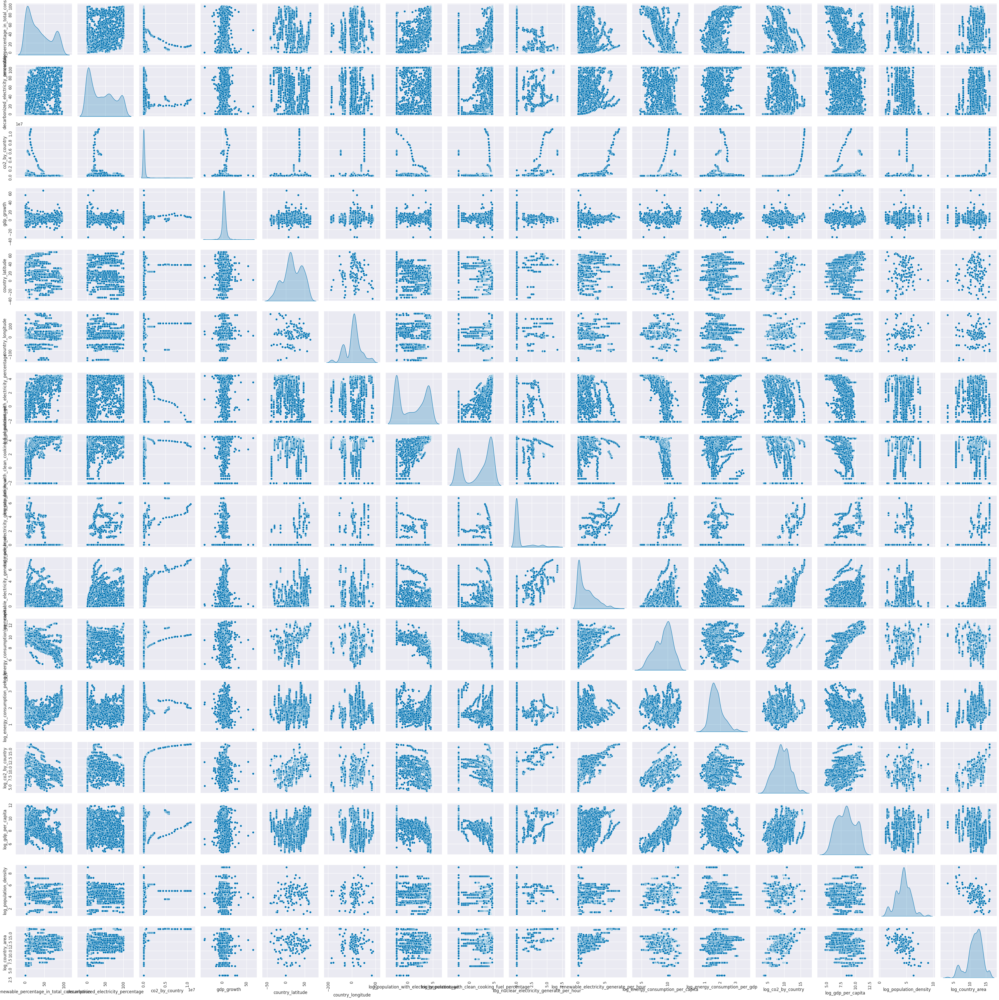

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Creating the pairplot
pairplot = sns.pairplot(df_transformed[quantitative_variables], diag_kind='kde')

# Rotating x-ticks and y-ticks using tick_params
for ax in pairplot.axes.flatten():
    ax.tick_params(axis='x', labelrotation=90)
    ax.tick_params(axis='y', labelrotation=90)

plt.tight_layout()
plt.show()

**Analysis of Dependencies Between Quantitative Variables and Target Variable**

  - `log_co2_by_country` has significant linear correlations with several variables, indicating potential predictors for a linear regression model.
  - However, the non-linear of `co2_by_country` patterns suggest that simple linear models may not fully capture the relationships, and we need more advanced models

  This will be clearly shown in the model prediction results in section 2.2.

## **1.5. Principal Componants Analysis**

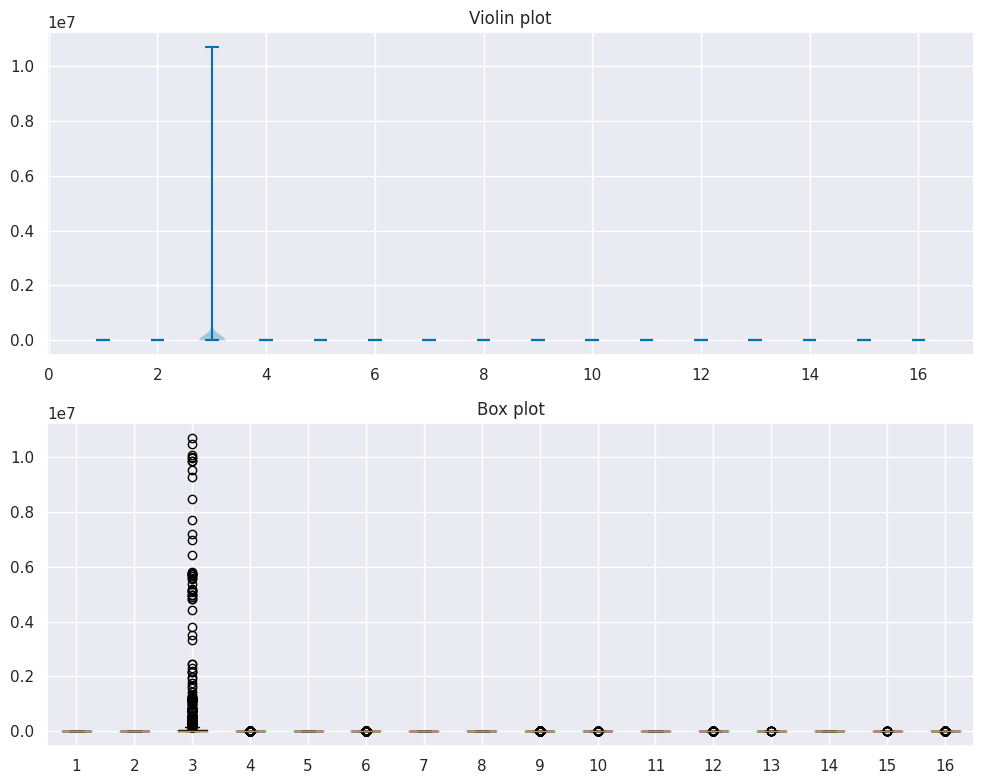

In [23]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

# violin plot
axs[0].violinplot(df_transformed[quantitative_variables], showmedians=True)
axs[0].set_title('Violin plot')

# box plot
axs[1].boxplot(df_transformed[quantitative_variables])
axs[1].set_title('Box plot')

plt.tight_layout()
plt.show()

In [24]:
from sklearn.preprocessing import scale

# Scale the data
df_scaled = scale(df_transformed[quantitative_variables])

# Convert the scaled data back to a DataFrame
df_scaled = pd.DataFrame(df_scaled, columns=quantitative_variables)

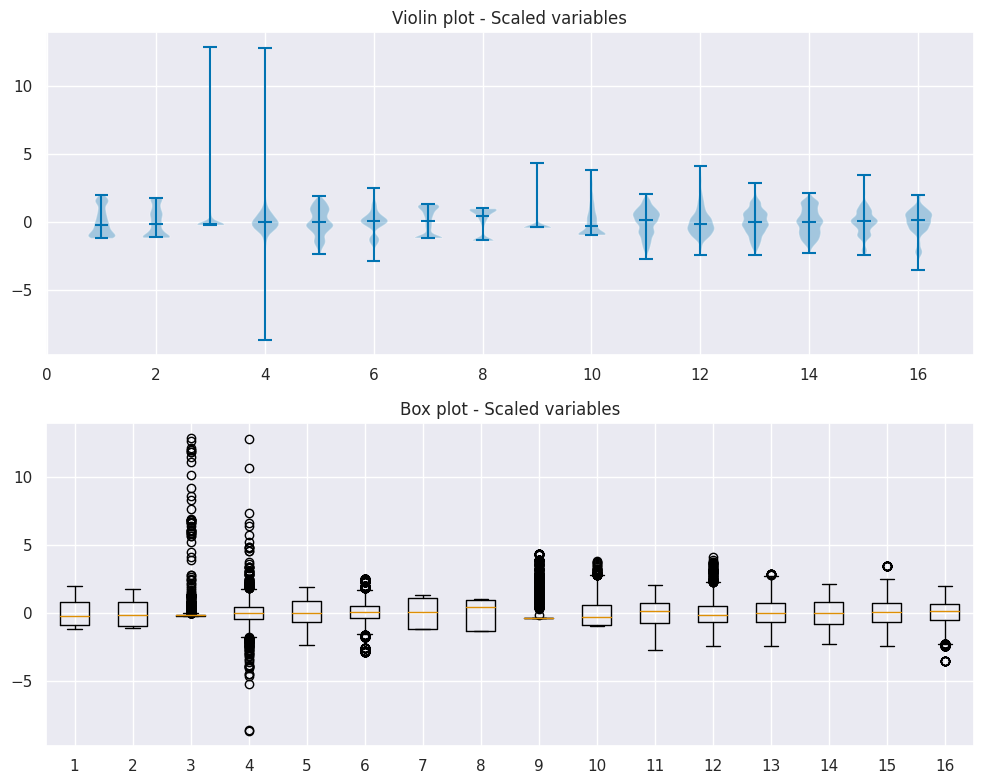

In [25]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

# violin plot
axs[0].violinplot(df_scaled, showmedians=True)
axs[0].set_title('Violin plot - Scaled variables')

# box plot
axs[1].boxplot(df_scaled)
axs[1].set_title('Box plot - Scaled variables')

plt.tight_layout()
plt.show()

In [26]:
from sklearn.decomposition import PCA

# Apply PCA
pca = PCA()
df_pca = pca.fit_transform(df_scaled)

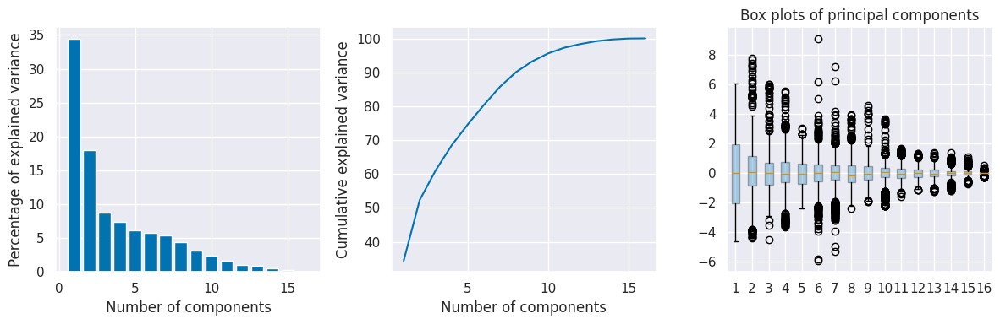

<Figure size 640x480 with 0 Axes>

In [27]:
explained_variance_ratio = 100*pca.explained_variance_ratio_

plt.figure(figsize = (12, 4))
plt.subplot(1,3,1)
n_bars = df_pca.shape[1]
plt.bar(np.arange(1, n_bars+1), explained_variance_ratio[:n_bars])
plt.xlabel("Number of components")
plt.ylabel("Percentage of explained variance")

plt.subplot(1,3,2)
plt.plot(np.arange(1, n_bars+1), np.cumsum(explained_variance_ratio))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

plt.subplot(1,3,3)
box = plt.boxplot(df_pca, patch_artist=True)
plt.setp(box["boxes"], alpha=.3)
plt.title("Box plots of principal components")
plt.tight_layout()
plt.show()

plt.tight_layout()
plt.show()

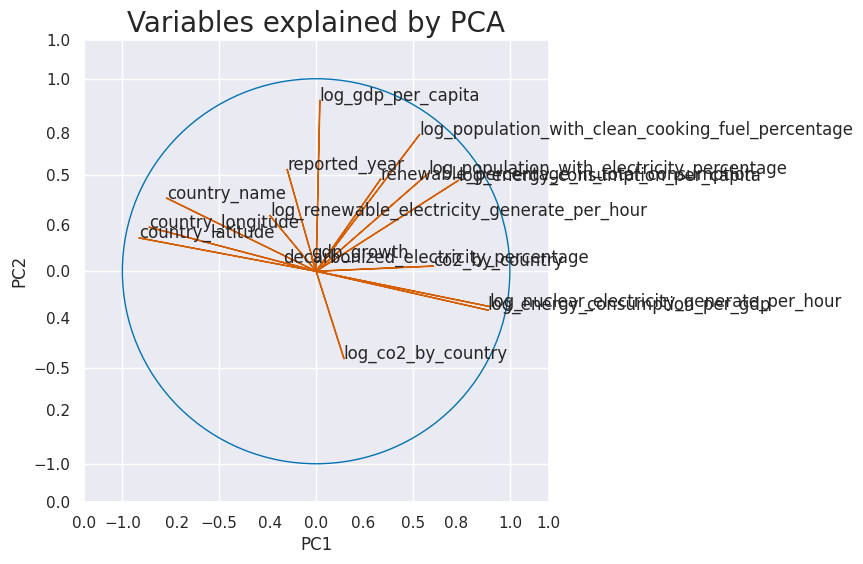

In [28]:
fig = plt.figure(figsize = (6,6))
plt.title('Variables explained by PCA', fontsize=20)

# coordonnées des variables
coord1=pca.components_[0]*np.sqrt(pca.explained_variance_[0])
coord2=pca.components_[1]*np.sqrt(pca.explained_variance_[1])
ax = fig.add_subplot(1, 1, 1)
for i, j, nom in zip(coord1,coord2, df_transformed):
    plt.text(i, j, nom)
    plt.arrow(0,0,i,j,color='r')
plt.axis((-1.2,1.2,-1.2,1.2))
ax.set_xlabel("PC1")
ax.set_ylabel('PC2')

# cercle
c=plt.Circle((0,0), radius=1, color='b', fill=False)
ax.add_patch(c)
plt.show()

### **Analysis**

1. **Number of Principal Components to Retain**:
   - The first principal component explains more than 35% of the variance, and a total of about 6 principal components can explain nearly 80% of the variance. This means that to retain at least 80% of the information, we need to keep at least 6 principal components, this do not deserve at all.

2. **Effectiveness of PCA with the Target Variable**:
   - The target variable `log_co2_by_country` or `co2_by_country` is not well represented in the first principal component plan.
   - From the PCA biplot, we can see that `log_co2_by_country` and `co2_by_country` do not contribute significantly to the first 2 principal components. This means that the first 2 principal components do not capture most of the information related to this variable.
   - Therefore, using PCA in this case seems ineffective for predicting `log_co2_by_country` or `co2_by_country`. PCA may minimize important information related to this target variable, leading to poor prediction performance.

## **1.6. $CO_{2}$ emissions over the years**

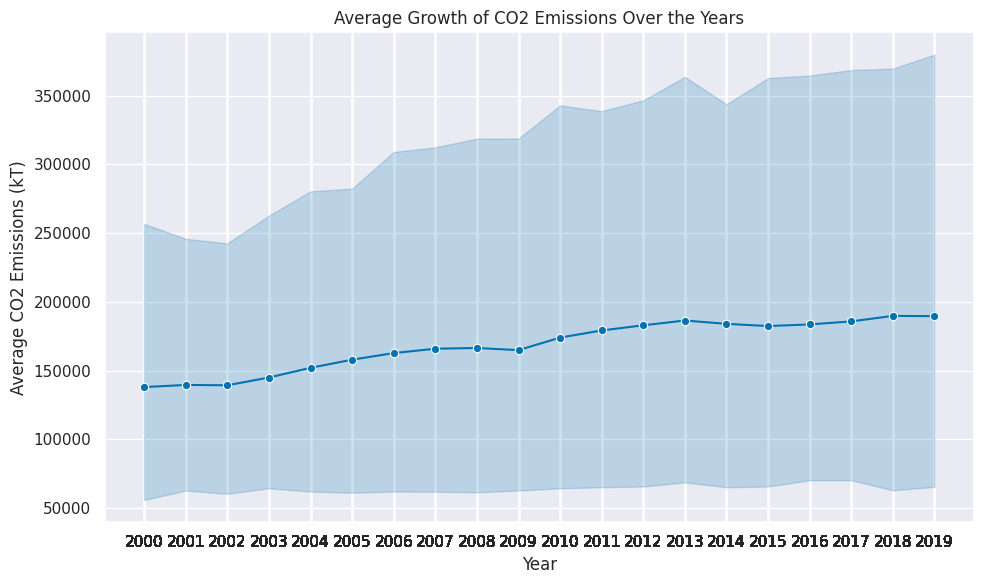

In [29]:
plt.figure(figsize = (10, 6))
sns.lineplot(data = df, x = 'reported_year', y = 'co2_by_country', marker = 'o')
plt.title('Average Growth of CO2 Emissions Over the Years')
plt.xlabel('Year')
plt.ylabel('Average CO2 Emissions (kT)')

plt.xticks(df['reported_year'])

plt.tight_layout()
plt.show()

In [30]:
avg_co2_by_year = df.groupby('reported_year',observed=True)['co2_by_country'].mean().reset_index()
avg_co2_by_year.head()

,reported_year,co2_by_country
0,2000,138016.423358
1,2001,139578.188406
2,2002,139321.070047
3,2003,144971.775235
4,2004,152039.360934


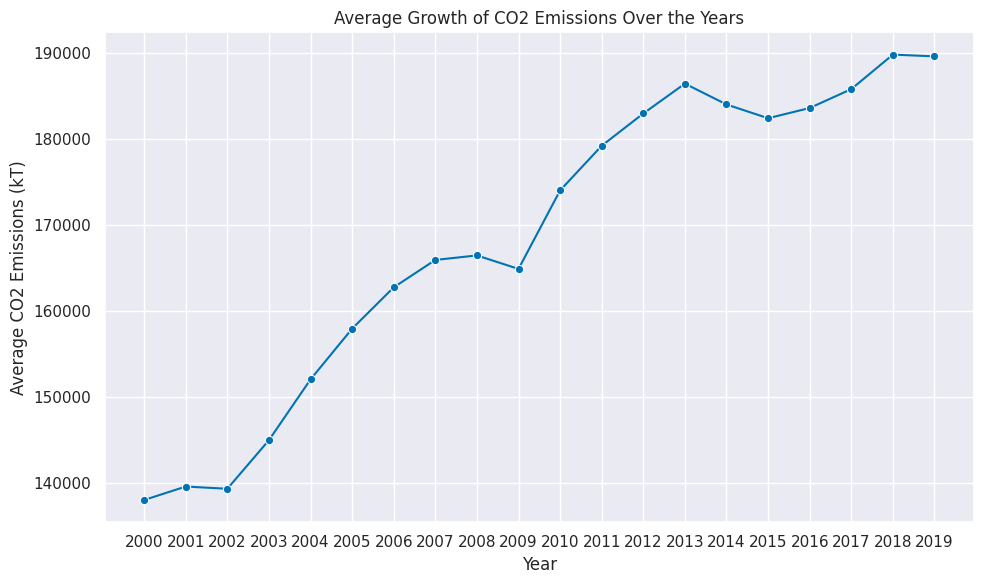

In [31]:
plt.figure(figsize = (10, 6))
sns.lineplot(data = avg_co2_by_year, x = 'reported_year', y = 'co2_by_country', marker = 'o')
plt.title('Average Growth of CO2 Emissions Over the Years')
plt.xlabel('Year')
plt.ylabel('Average CO2 Emissions (kT)')

plt.xticks(avg_co2_by_year['reported_year'])

plt.tight_layout()
plt.show()

# **2. Modelisation**

## **2.1. Pre-Processing**

In [32]:
# Using pandas get_dummies to perform one-hot encoding
onehot_encoded_years=pd.get_dummies(df['reported_year'], prefix='year', dtype='int64')
onehot_encoded_years.head()

,year_2000,year_2001,year_2002,year_2003,year_2004,year_2005,year_2006,year_2007,year_2008,year_2009,...,year_2011,year_2012,year_2013,year_2014,year_2015,year_2016,year_2017,year_2018,year_2019,year_2020
0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
quantitative_variables = df_transformed.select_dtypes(include=['float64']).columns
df_modelised = pd.concat([onehot_encoded_years,df_transformed[quantitative_variables]],axis=1)
df_modelised.head()

,year_2000,year_2001,year_2002,year_2003,year_2004,year_2005,year_2006,year_2007,year_2008,year_2009,...,log_population_with_electricity_percentage,log_population_with_clean_cooking_fuel_percentage,log_nuclear_electricity_generate_per_hour,log_renewable_electricity_generate_per_hour,log_energy_consumption_per_capita,log_energy_consumption_per_gdp,log_co2_by_country,log_gdp_per_capita,log_population_density,log_country_area
0,0,0,0,1,0,0,0,0,0,0,...,4.446895,4.506454,0.0,0.488580,5.442280,0.875469,7.107425,5.255847,4.110874,13.388154
1,0,0,0,0,1,0,0,0,0,0,...,4.382464,4.490881,0.0,0.444686,5.324137,0.788457,6.938284,5.358387,4.110874,13.388154
2,0,0,0,0,0,1,0,0,0,0,...,4.313602,4.476200,0.0,0.463734,5.533663,0.879627,7.346655,5.493190,4.110874,13.388154
3,0,0,0,0,0,0,1,0,0,0,...,4.239618,4.457250,0.0,0.494696,5.721691,0.916291,7.473637,5.578724,4.110874,13.388154
4,0,0,0,0,0,0,0,1,0,0,...,4.159648,4.440296,0.0,0.559616,5.872906,0.928219,7.479300,5.888028,4.110874,13.388154


In [34]:
plt.figure(figsize=(8, 8))
df_modelised.describe().T.style.background_gradient(axis = 1, cmap='RdBu', vmin=-0.5,vmax=0.5)

,count,mean,std,min,25%,50%,75%,max
year_2000,2868.000000,0.047768,0.213313,0.000000,0.000000,0.000000,0.000000,1.000000
year_2001,2868.000000,0.048117,0.214051,0.000000,0.000000,0.000000,0.000000,1.000000
year_2002,2868.000000,0.048815,0.215518,0.000000,0.000000,0.000000,0.000000,1.000000
year_2003,2868.000000,0.049163,0.216246,0.000000,0.000000,0.000000,0.000000,1.000000
year_2004,2868.000000,0.049163,0.216246,0.000000,0.000000,0.000000,0.000000,1.000000
year_2005,2868.000000,0.049163,0.216246,0.000000,0.000000,0.000000,0.000000,1.000000
year_2006,2868.000000,0.049163,0.216246,0.000000,0.000000,0.000000,0.000000,1.000000
year_2007,2868.000000,0.050209,0.218414,0.000000,0.000000,0.000000,0.000000,1.000000
year_2008,2868.000000,0.050209,0.218414,0.000000,0.000000,0.000000,0.000000,1.000000
year_2009,2868.000000,0.050209,0.218414,0.000000,0.000000,0.000000,0.000000,1.000000


<Figure size 800x800 with 0 Axes>

Based on the color range, we observe that only value $0$ is presented in the column `year_2020`.

In [35]:
df_modelised.drop(columns = ['year_2020'], inplace = True)

<Axes: ylabel='Frequency'>

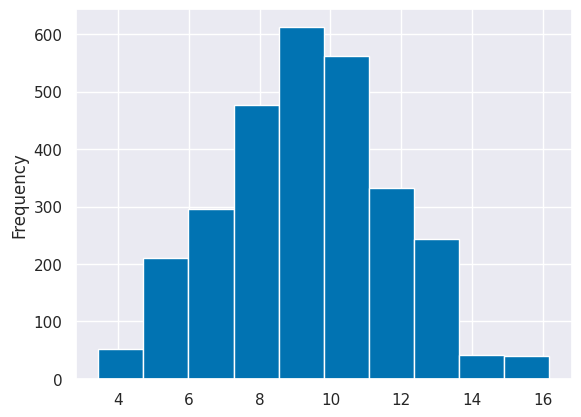

In [36]:
X = df_modelised.drop(columns=['co2_by_country', 'log_co2_by_country'])
y_log = df_modelised['log_co2_by_country']

y_log.plot(kind='hist')

Here if we work with `log_co2_by_country`, this will bring us some benefits as follows:
- The graph is more bell-shaped, closer to the gaussien distribution.
- It provides benefits in prediction with linear models.

However, this also bring us following disadvantages:
- The change in scale also changes the importance of the variables, making it difficult to explain the model.
- Results are no longer consistent with the EDA process.

We therefore decide to use both `log_co2_by_country` and `co2_by_country` as target variables, depending on the model.

<Axes: ylabel='Frequency'>

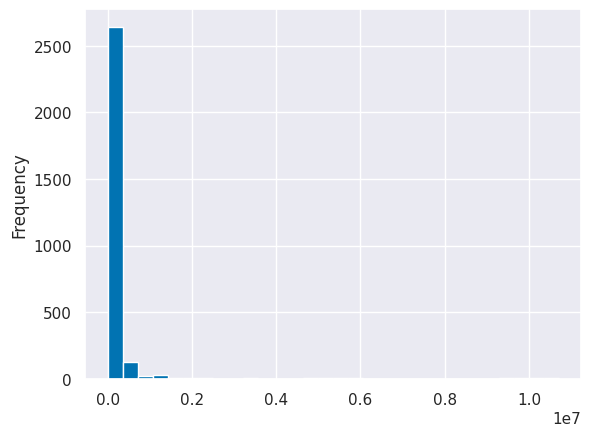

In [37]:
y = df_modelised['co2_by_country']

y.plot(kind='hist', bins = 30)

We can see that the target variable `co2_by_country` is highly skewed, which was shown in the EDA section, as some countries have much higher CO2 than the rest.

In [38]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=28)
X_train, X_test, y_train_log, y_test_log = train_test_split(X, y_log, test_size=0.2, random_state=28)
# Display the shapes of the resulting datasets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)
print("y_train_log shape:", y_train_log.shape)
print("y_test_log shape:", y_test_log.shape)

X_train shape: (2294, 34)
X_test shape: (574, 34)
y_train shape: (2294,)
y_test shape: (574,)
y_train_log shape: (2294,)
y_test_log shape: (574,)


In [39]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
ss.fit(X_train)
X_train = ss.transform(X_train)
X_train = pd.DataFrame(X_train, columns=X.columns)
# Keep the standardization parameters unchanged for the test set
X_test = ss.transform(X_test)
X_test = pd.DataFrame(X_test, columns=X.columns)

### **Why Splitting the Dataset is Necessary ?**

1. **Assessment of Model Generalization**: The primary reason to split the data into training and testing sets is to assess the performance of a predictive model on new, unseen data. The training set is used to train the model, while the test set serves as a proxy for new data, helping to evaluate how well the model generalizes to data it hasn’t encountered during training.

2. **Avoiding Overfitting**: Overfitting occurs when a model learns the details and noise in the training data to an extent that it negatively impacts the performance of the model on new data. By using a separate test set, we can check for overfitting to ensure that the model performs well on general cases and not just on the data it was trained on.

3. **Model Selection**: In scenarios where multiple models or different types of machine learning algorithms are being compared, the test set serves as a fair basis for comparing their performance to select the best performing model.

## **2.2. Regression Models**

### **Useful functions**

In [40]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

Function `selection_model` is to perform model fitting, hyperparameter tuning via grid search, and evaluation. It also correctly handles both scenarios where hyperparameters are provided for tuning and when no tuning is needed.

**Overview of `selection_model` Function**:
1. **Parameter Tuning and Model Fitting**: If `param_grid` is provided, it uses `GridSearchCV` from scikit-learn to find the best hyperparameters for the model within the provided range using k-fold cross-validation. If no parameters are specified for tuning, it directly fits the model to the training data.
2. **Prediction and Transformation**: It predicts on the test set, and if we have used log-transformed target values (`y_log`), we need to re-transform the predictions and the observations back to their original scale.
3. **Evaluation**: Calculates and prints the Mean Squared Error (MSE) and ($R^2$) score on the test set, comparing the observed values (`y_test`) and the predictions.

**Notes:**
- We have used `np.log1p` for transforming our target, so `np.exp(y_log) - 1` will reverse this transformation.
- Negation of MSE: The `neg_mean_squared_error` ensures that the grid search maximizes the negative value, effectively minimizing the MSE.

In [41]:
def selection_model(model, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test, param_grid = None, k_fold = 5, log = False):
    """
    Fits a model using training data and evaluates it on a test set. If param_grid is provided,
    performs a grid search to find the best parameters.

    Args:
    - model: The machine learning model to be used.
    - X_train, y_train: Training data features and target.
    - X_test, y_test: Test data features and target.
    - param_grid (dict): Parameters for grid search.
    - k_fold (int): Number of folds for cross-validation.
    - log (bool): Whether to use logarithmic transformation on the target variable.

    Returns:
    - selected_model: The trained model.
    - y_pred: Predictions on the test set.
    - r2: R2 score
    - mse: Mean squared error
    """
    if log:
        y_train = y_train_log
        y_test = y_test_log

    if param_grid is not None:
        grid_search=GridSearchCV(model,param_grid,cv=k_fold,n_jobs=-1, scoring='neg_mean_squared_error', verbose =2)
        grid_search.fit(X_train, y_train)

        #selected_model will be the optimized version of the models after the search by cross-validation.
        selected_model = grid_search.best_estimator_

        print("--------------------------------By cross-validation--------------------------------")
        print('Best Parameters =', grid_search.best_params_)
        if log:
            print(f'Best MSE on log-transformed scale = {-grid_search.best_score_:.3e}')
        else:
            print(f'Best MSE = {-grid_search.best_score_:.3e}')

    else:
        selected_model = model
        selected_model.fit(X_train, y_train)

    if log:
        # Predict on the test set
        y_pred_log = selected_model.predict(X_test)
        y_pred = np.exp(y_pred_log)-1

        # Evaluate the model
        mse_log = mean_squared_error(y_test, y_pred_log)
        r2_log = r2_score(y_test, y_pred_log)
        mse = mean_squared_error(np.exp(y_test)-1, y_pred)
        r2 = r2_score(np.exp(y_test)-1, y_pred)

        print("--------------------------------On test set--------------------------------")
        print(f'MSE on log-transformed scale = {mse_log:.3e}')
        print('R2 on log-transformed scale =', r2_log)
        print(f'MSE on original scale = {mse:.3e}')
        print('R2 on original scale =', r2)

    else:
        # Predict on the test set
        y_pred = selected_model.predict(X_test)

        # Evaluate the model
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print("--------------------------------On test set--------------------------------")
        print(f'MSE on test set = {mse:.3e}')
        print('R2 on test set =', r2)

    return selected_model, y_pred, r2, mse

The `plot_prediction` function is designed to visualize the results of our predictions against the actual data. It consists of two plots:

1. **Actual vs. Predicted Plot**: This helps in visually assessing the accuracy of the predictions. Points closer to a 45-degree line indicate better predictions.
2. **Residual Plot**: This shows the residuals (differences between actual and predicted values) against the predictions. Ideally, the residuals should be randomly scattered around the horizontal line at 0, indicating that the model's errors are random and do not follow any patterns.

In [42]:
def plot_prediction(y_pred, y_test = y_test, log = False):
    if log:
        y_test=np.exp(y_test_log)-1

    plt.figure(figsize = (10,5))
    # Plot Actual vs. Predicted values
    plt.subplot(1, 2, 1)
    plt.scatter(y_pred, y_test, alpha=0.5)
    plt.xlabel('Predicted CO2 by Country')
    plt.ylabel('Observed CO2 by Country')
    plt.title('Actual vs. Predicted')
    plt.plot([min(y_pred), max(y_pred)], [min(y_test), max(y_test)], 'r')  # Diagonal line for reference

    # Plot Residuals
    plt.subplot(1, 2, 2)
    plt.scatter(y_pred, y_test - y_pred, alpha=0.5)
    plt.xlabel('Prediction')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.hlines(0, min(y_pred), max(y_pred), colors='r')  # Horizontal line at 0

    plt.tight_layout()
    plt.show()


### **2.2.1. Linear regression**

In [43]:
from sklearn import linear_model

#### **Without variable selection and without penalization**

##### **On the original target variable**

--------------------------------On test set--------------------------------
MSE on test set = 5.066e+11
R2 on test set = 0.42112909008557453


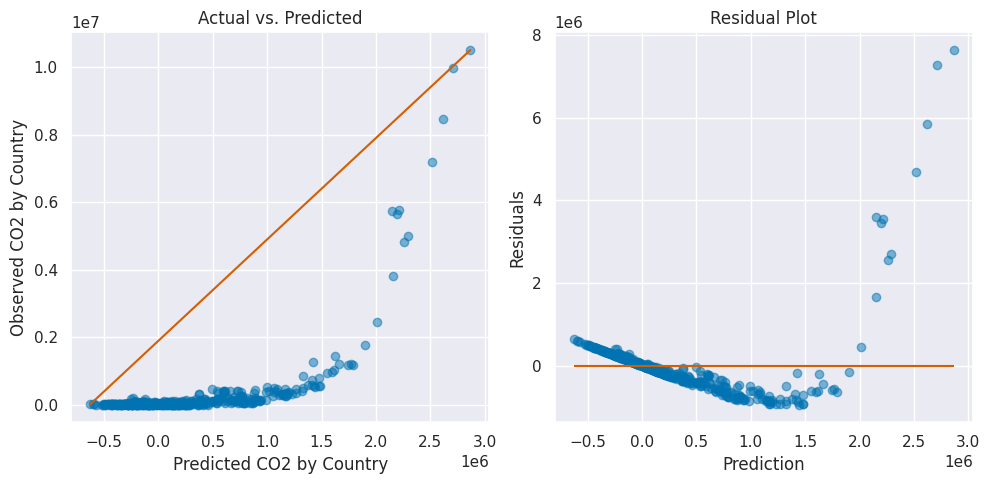

In [44]:
reg, y_pred, r2_regRaw, mse_regRaw = selection_model(linear_model.LinearRegression())
plot_prediction(y_pred)

##### **On the transformed target variable**

--------------------------------On test set--------------------------------
MSE on log-transformed scale = 1.033e-01
R2 on log-transformed scale = 0.9833819085652724
MSE on original scale = 1.197e+10
R2 on original scale = 0.9863189236391042


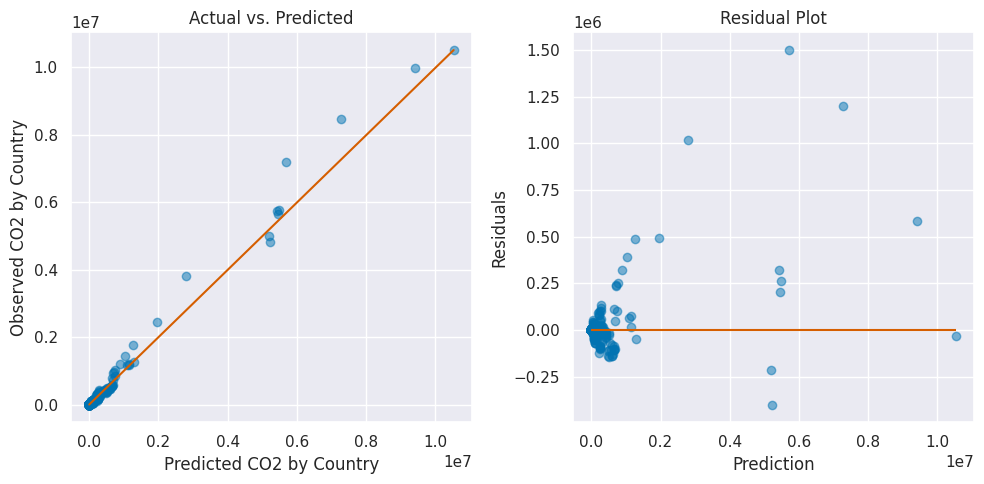

In [45]:
reg, y_pred, r2_reg, mse_reg = selection_model(linear_model.LinearRegression(), log=True)
plot_prediction(y_pred, log=True)

**Interpretation of Results**

1. **Comparison**: We can clearly see the benefits of using transform variable for linear models, as we stated above. The MSE of the model working with `co2_by_country` is 40 times larger than the model working with `log_co2_by_country`.

2. **High $R^2$ Scores**: In the model working with transformed variable, both the log-transformed and original scales show high $R^2$ values (above 0.98), suggesting that the model explains a significant portion of the variance in the target variable on both scales. This is a strong indicator that the model fits the data well.

3. **Discrepancy in MSE Values**: Despite the high $R^2$ scores, the MSE on the original scale is extremely high. This suggests that while the model is capturing the variance very well, the scale of errors when transformed back to the original scale becomes significantly larger, because even small differences in the log scale can translate into large absolute errors on the original scale.
   
**Model Evaluation**: In the case of working with `log_co2_by_country`, because $R^2$ scores are excellent in both 2 scalew, it's crucial to consider the MSE on the original scale as the criteria of evaluation. That why we have choosen **MSE (instead of $R^2$ by defaut)** as the score in the `selected_model` function.
  

In [46]:
print(f'Linear regression coefficient: {reg.coef_}')
print(f'Intercept: {reg.intercept_}')

Linear regression coefficient: [ 1.85869319e+11  1.79787675e+11  1.79009561e+11  1.84372095e+11
  1.79787675e+11  1.82097638e+11  1.74251714e+11  1.82859669e+11
  1.83617806e+11  1.87351705e+11  1.78227294e+11  1.79787675e+11
  1.81331662e+11  1.86612344e+11  1.84372095e+11  1.90273351e+11
  1.86612344e+11  1.86612344e+11  1.85869319e+11  1.88087444e+11
 -3.38766216e-01 -1.54964254e-01 -2.33573398e-02  5.36737745e-02
 -4.56744431e-03 -1.58922713e-01  2.25161104e-01 -2.83499953e-02
  1.34149315e-02  9.40847119e-01  8.87989909e-02  4.76098708e-01
  1.33038066e+00  2.38604736e+00]
Intercept: 9.306352604278883


#### **Variable selection with regularization Lasso**

Fitting 5 folds for each of 9 candidates, totalling 45 fits
--------------------------------By cross-validation--------------------------------
Best Parameters = {'alpha': 0.001}
Best MSE on log-transformed scale = 1.049e-01
--------------------------------On test set--------------------------------
MSE on log-transformed scale = 1.035e-01
R2 on log-transformed scale = 0.9833606602494067
MSE on original scale = 1.296e+10
R2 on original scale = 0.9851968178660997


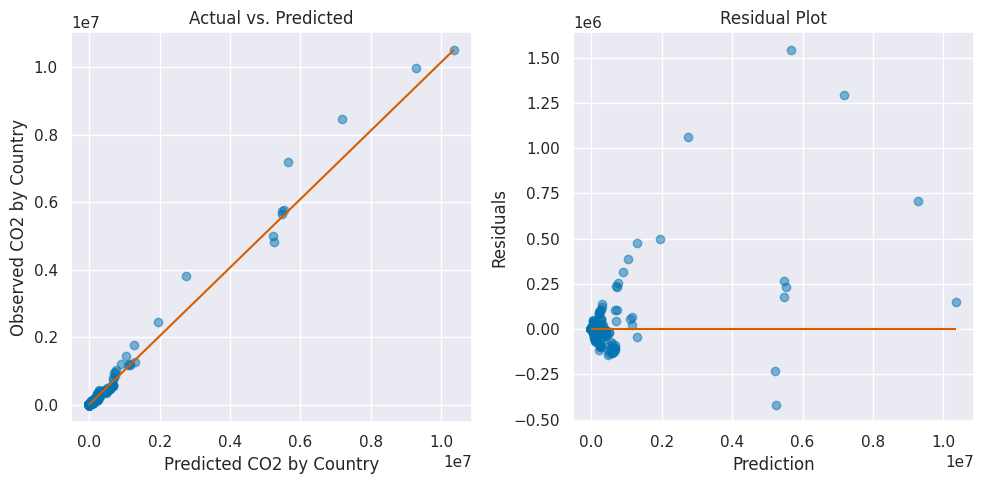

In [47]:
# grid of alpha parameter values to optimize
param_grid = {
    "alpha":[0.0001,0.0005,0.001,0.005,0.01,0.05,0.1,0.5,1]
    }
regLasso, y_pred, r2_Lasso, mse_Lasso = selection_model(linear_model.Lasso(),param_grid=param_grid, log=True)
plot_prediction(y_pred, log=True)

[ 1.72348979e-04  1.08841151e-02  6.03537133e-03  4.09165440e-03
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -4.82869738e-03
 -1.36174418e-02 -4.82099816e-03 -4.82222368e-03 -7.79065762e-03
 -0.00000000e+00 -5.17393180e-03 -3.64943809e-03  7.85945221e-03
  1.15965486e-02  1.34355551e-02  1.37691869e-02  1.12913295e-02
 -3.33925960e-01 -1.55420766e-01 -2.21100515e-02  5.24325807e-02
 -3.57037083e-03 -1.53747352e-01  2.09297876e-01 -2.21639779e-02
  1.33069365e-02  9.52039339e-01  8.17707694e-02  4.53293459e-01
  1.32559253e+00  2.38045287e+00]
Lasso preserves 30 variables and removes 4


Text(0.5, 1.0, 'Lasso model coefficients')

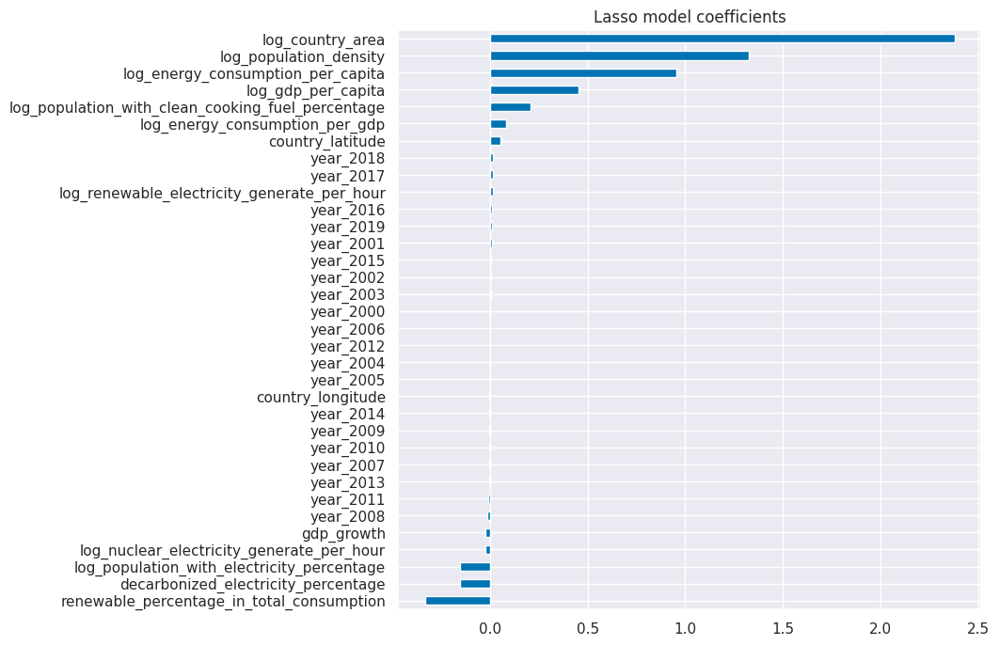

In [48]:
# Coefficients
coefs = regLasso.coef_
print(coefs)

coefs = pd.Series(coefs, index = X_train.columns)
print("Lasso preserves " + str(sum(coefs != 0)) +
       " variables and removes " + str(sum(coefs == 0)))

imp_coef = coefs.sort_values()
plt.figure(figsize=(8, 8))
imp_coef.plot(kind = "barh")
plt.title("Lasso model coefficients")

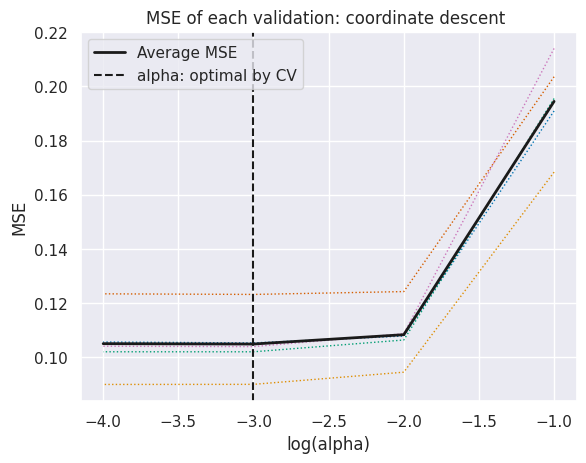

In [49]:
from sklearn.linear_model import LassoCV
model = LassoCV(cv=5, alphas=np.float_power(10,(np.array(range(-4,0,1)))),n_jobs=-1,random_state=12).fit(X_train,y_train_log)
m_log_alphas = np.log10(model.alphas_)

plt.figure()
plt.plot(m_log_alphas, model.mse_path_, ':', linewidth=1)
plt.plot(m_log_alphas, model.mse_path_.mean(axis=-1), 'k',
          label='Average MSE', linewidth=2)
plt.axvline(np.log10(model.alpha_), linestyle='--', color='k',
             label='alpha: optimal by CV')

plt.legend()

plt.xlabel('log(alpha)')
plt.ylabel('MSE')
plt.title('MSE of each validation: coordinate descent ')
plt.show()

Optimal alpha found here is $10^{-3} = 0.001$, which is exactly equivalent to the alpha found before.

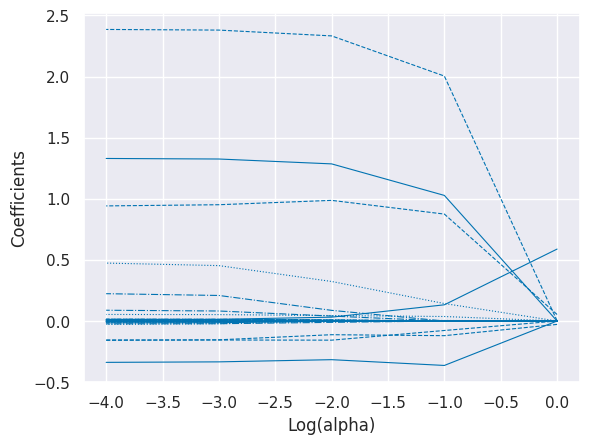

In [50]:
from itertools import cycle

from sklearn.linear_model import lasso_path
alphas_lasso, coefs_lasso, _ = lasso_path(X_train,y_train_log, alphas=np.float_power(10,(np.array(range(-4,1,1)))))


plt.figure()
ax = plt.gca()

styles = cycle(['-', '--', '-.', ':'])

neg_log_alphas_lasso = np.log10(alphas_lasso)
for coef_l, s in zip(coefs_lasso, styles):
    l1 = plt.plot(neg_log_alphas_lasso, coef_l, linestyle=s, c='b', lw = 0.8)
plt.xlabel('Log(alpha)')
plt.ylabel('Coefficients')
plt.show()

**Shape of Lines:**
The lines on the graph show the change of coefficients according to alpha. As `alpha` increases (`log(alpha)` moves right on the X-axis), many coefficients gradually approach zero, reflecting Lasso's property of sparsity in the model by pushing number of coefficients to zero.

**Alpha's Influence on Sparsity:**
The key point of Lasso is feature selection through reducing unimportant coefficients to zero. This helps eliminate some less important features from the final model, thereby simplifying the model while still retaining the necessary efficiency.

#### **Penalization with regularization Ridge**

Fitting 5 folds for each of 7 candidates, totalling 35 fits
--------------------------------By cross-validation--------------------------------
Best Parameters = {'alpha': 0.001}
Best MSE on log-transformed scale = 1.051e-01
--------------------------------On test set--------------------------------
MSE on log-transformed scale = 1.033e-01
R2 on log-transformed scale = 0.9833839686594128
MSE on original scale = 1.204e+10
R2 on original scale = 0.9862389680361516


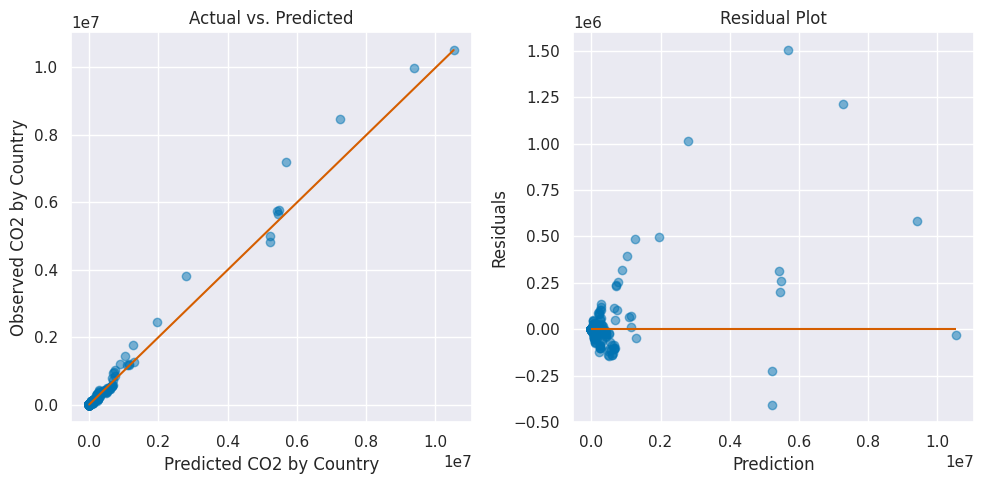

In [51]:
# grid of alpha parameter values to optimize
param_grid = {
    "alpha":[0.001,0.005,0.01,0.05,0.1,0.5,1]
    }
regRidge, y_pred, r2_Ridge, mse_Ridge = selection_model(linear_model.Ridge(),param_grid=param_grid, log=True)
plot_prediction(y_pred, log=True)

#### **Variable selection with AIC and BIC criteria**

**Function `calculate_aic_bic`**: Calculate AIC and BIC values for a regression model.

**Function `backward_elimination`**:

- Start with all variables in the model and calculate AIC and BIC values.
- Perform backward elimination based on both criteria:
    - Calculate AIC and BIC for each model when removing a variable.
    - If removing a variable reduces the AIC or BIC value, that variable will be removed from the corresponding model.
    - This process continues until there are no more variables that can be eliminated to improve the AIC or BIC value.
- Print out the final results for both AIC and BIC.

Running the above code will perform backward elimination, eliminating variables step by step and printing out the remaining variables in the model along with the best AIC and BIC values.

In [52]:
import statsmodels.api as sm

# Function to calculate AIC and BIC for a given regression model
def calculate_aic_bic(y, X):
    model = sm.OLS(y, X).fit()
    return model.aic, model.bic

# Function for backward elimination based on AIC
def backward_elimination_aic(X, y):
    initial_vars = X.columns.tolist()  # List of initial variables
    best_aic, _ = calculate_aic_bic(y, sm.add_constant(X[initial_vars]))  # Calculate AIC for the initial model
    best_vars = initial_vars.copy()  # Copy the list of initial variables

    while True:
        aic_values = []

        # Calculate AIC for the model excluding each variable one by one
        for var in best_vars:
            vars_subset = [v for v in best_vars if v != var]
            if vars_subset:  # Check if the subset of variables is not empty
                aic, _ = calculate_aic_bic(y, sm.add_constant(X[vars_subset]))
                aic_values.append((aic, var))

        if not aic_values:
            break

        # Sort AIC values in ascending order
        aic_values.sort()

        # Get the minimum AIC value and the corresponding variable
        current_aic, worst_var = aic_values[0]

        # If AIC is reduced, remove the variable and update the best AIC
        if current_aic < best_aic:
            best_aic = current_aic
            best_vars.remove(worst_var)
            print(f"Removing {worst_var} reduced AIC to {best_aic:.2f}")
        else:
            break

    print(f"Final model variables by AIC: {best_vars}")
    print(f"Final AIC: {best_aic:.2f}")
    print(f"AIC retains {len(best_vars)} variables and removes {len(initial_vars) - len(best_vars)} variables.")
    return best_vars, best_aic

# Function for backward elimination based on BIC
def backward_elimination_bic(X, y):
    initial_vars = X.columns.tolist()  # List of initial variables
    _, best_bic = calculate_aic_bic(y, sm.add_constant(X[initial_vars]))  # Calculate BIC for the initial model
    best_vars = initial_vars.copy()  # Copy the list of initial variables

    while True:
        bic_values = []

        # Calculate BIC for the model excluding each variable one by one
        for var in best_vars:
            vars_subset = [v for v in best_vars if v != var]
            if vars_subset:  # Check if the subset of variables is not empty
                _, bic = calculate_aic_bic(y, sm.add_constant(X[vars_subset]))
                bic_values.append((bic, var))

        if not bic_values:
            break

        # Sort BIC values in ascending order
        bic_values.sort()

        # Get the minimum BIC value and the corresponding variable
        current_bic, worst_var = bic_values[0]

        # If BIC is reduced, remove the variable and update the best BIC
        if current_bic < best_bic:
            best_bic = current_bic
            best_vars.remove(worst_var)
            print(f"Removing {worst_var} reduced BIC to {best_bic:.2f}")
        else:
            break

    print(f"Final model variables by BIC: {best_vars}")
    print(f"Final BIC: {best_bic:.2f}")
    print(f"BIC retains {len(best_vars)} variables and removes {len(initial_vars) - len(best_vars)} variables.")
    return best_vars, best_bic

##### **AIC criteria**

In [53]:
# Run backward elimination for AIC
best_vars_aic, best_aic = backward_elimination_aic(X_train, y_train_log.reset_index(drop=True))

Removing country_longitude reduced AIC to 1322.72
Removing log_renewable_electricity_generate_per_hour reduced AIC to 1321.69
Final model variables by AIC: ['year_2000', 'year_2001', 'year_2002', 'year_2003', 'year_2004', 'year_2005', 'year_2006', 'year_2007', 'year_2008', 'year_2009', 'year_2010', 'year_2011', 'year_2012', 'year_2013', 'year_2014', 'year_2015', 'year_2016', 'year_2017', 'year_2018', 'year_2019', 'renewable_percentage_in_total_consumption', 'decarbonized_electricity_percentage', 'gdp_growth', 'country_latitude', 'log_population_with_electricity_percentage', 'log_population_with_clean_cooking_fuel_percentage', 'log_nuclear_electricity_generate_per_hour', 'log_energy_consumption_per_capita', 'log_energy_consumption_per_gdp', 'log_gdp_per_capita', 'log_population_density', 'log_country_area']
Final AIC: 1321.69
AIC retains 32 variables and removes 2 variables.


--------------------------------On test set--------------------------------
MSE on log-transformed scale = 1.039e-01
R2 on log-transformed scale = 0.9832887522044361
MSE on original scale = 1.322e+10
R2 on original scale = 0.9848951064032307


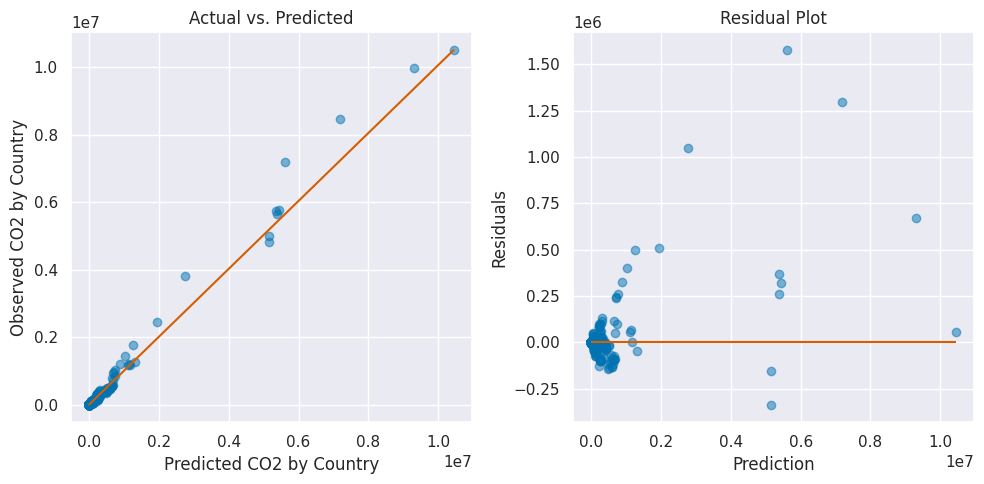

In [54]:
regAIC, y_pred, r2_aic, mse_aic = selection_model(model = linear_model.LinearRegression(), X_train=X_train[best_vars_aic], X_test=X_test[best_vars_aic], log=True)
plot_prediction(y_pred, log=True)

[ 4.96828807e+09  4.80572571e+09  4.78492670e+09  4.92826727e+09
  4.80572571e+09  4.86747102e+09  4.65774943e+09  4.88784013e+09
  4.90810512e+09  5.00791228e+09  4.76401672e+09  4.80572571e+09
  4.84699648e+09  4.98814916e+09  4.92826727e+09  5.08600789e+09
  4.98814916e+09  4.98814916e+09  4.96828807e+09  5.02757859e+09
 -3.35519075e-01 -1.51231647e-01 -2.42413282e-02  5.28772175e-02
 -1.62538528e-01  2.29694843e-01 -2.42467523e-02  9.45626616e-01
  8.65459442e-02  4.79566574e-01  1.33368027e+00  2.39315903e+00]


Text(0.5, 1.0, 'AIC model coefficients')

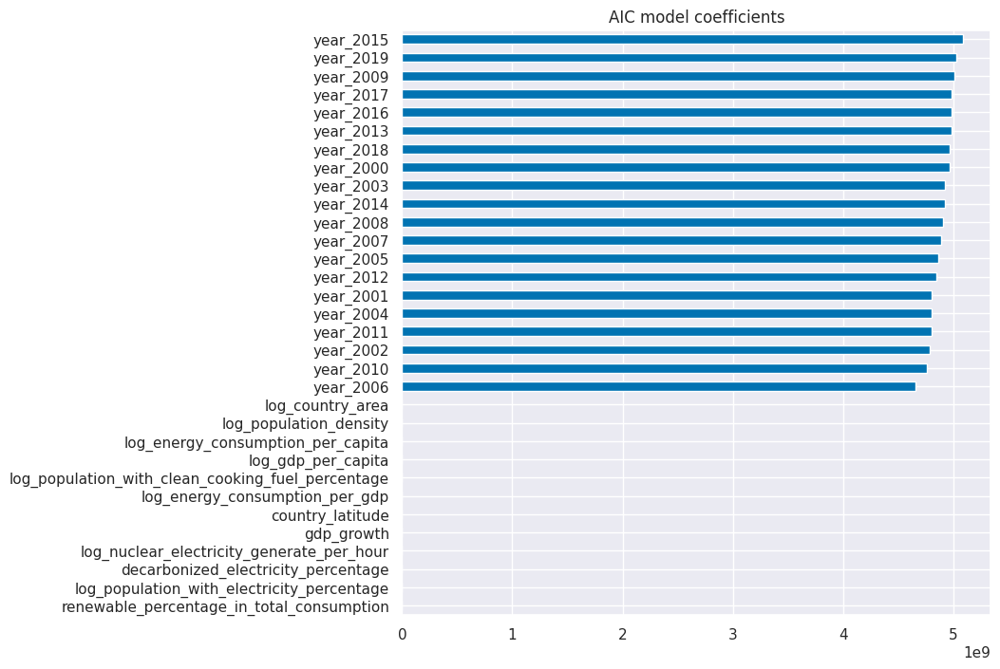

In [55]:
# Coefficients
coefs = regAIC.coef_
print(coefs)

coefs = pd.Series(coefs, index = best_vars_aic)

imp_coef = coefs.sort_values()
plt.figure(figsize=(8, 8))
imp_coef.plot(kind = "barh")
plt.title("AIC model coefficients")

##### **BIC criteria**

In [56]:
# Run backward elimination for BIC
best_vars_bic, best_bic = backward_elimination_bic(X_train, y_train_log.reset_index(drop=True))

Removing country_longitude reduced BIC to 1512.07
Removing log_renewable_electricity_generate_per_hour reduced BIC to 1505.31
Removing log_nuclear_electricity_generate_per_hour reduced BIC to 1504.77
Removing year_2005 reduced BIC to 1504.77
Removing year_2012 reduced BIC to 1497.03
Removing year_2006 reduced BIC to 1489.30
Removing year_2004 reduced BIC to 1481.57
Removing year_2000 reduced BIC to 1473.88
Removing year_2014 reduced BIC to 1466.54
Removing year_2010 reduced BIC to 1459.23
Removing year_2009 reduced BIC to 1451.83
Removing year_2013 reduced BIC to 1444.37
Removing year_2007 reduced BIC to 1436.86
Removing year_2011 reduced BIC to 1429.80
Removing year_2003 reduced BIC to 1423.48
Removing year_2002 reduced BIC to 1417.28
Removing year_2015 reduced BIC to 1412.38
Removing year_2001 reduced BIC to 1407.69
Removing year_2019 reduced BIC to 1403.74
Removing year_2016 reduced BIC to 1399.29
Removing year_2017 reduced BIC to 1395.41
Removing year_2018 reduced BIC to 1391.21
Re

--------------------------------On test set--------------------------------
MSE on log-transformed scale = 1.045e-01
R2 on log-transformed scale = 0.9831909105252493
MSE on original scale = 7.643e+09
R2 on original scale = 0.9912676295783546


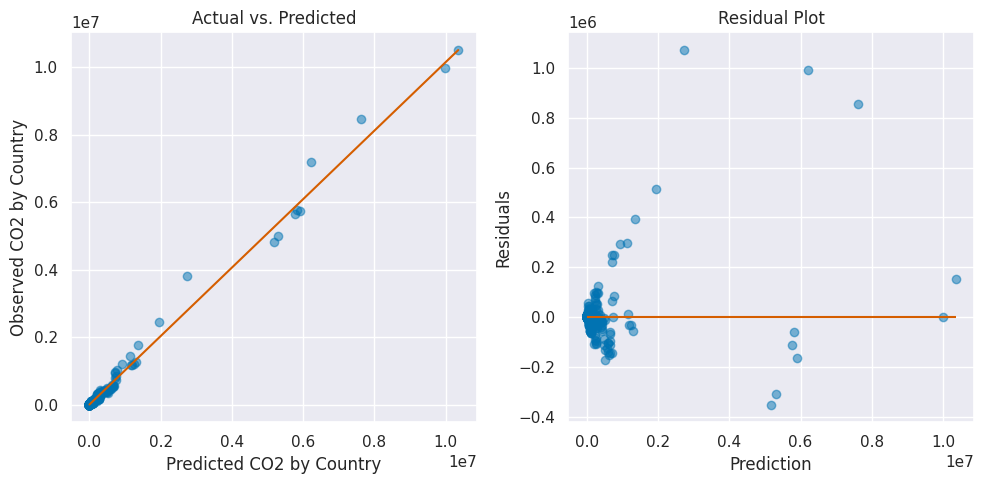

In [57]:
regBIC, y_pred, r2_bic, mse_bic = selection_model(model = linear_model.LinearRegression(), X_train=X_train[best_vars_bic], X_test=X_test[best_vars_bic], log=True)
plot_prediction(y_pred, log=True)

[-0.31977168 -0.15878178 -0.02513553  0.04611276 -0.17624343  0.223571
  0.96597647  0.07415501  0.44093207  1.32551238  2.38180777]


Text(0.5, 1.0, 'BIC model coefficients')

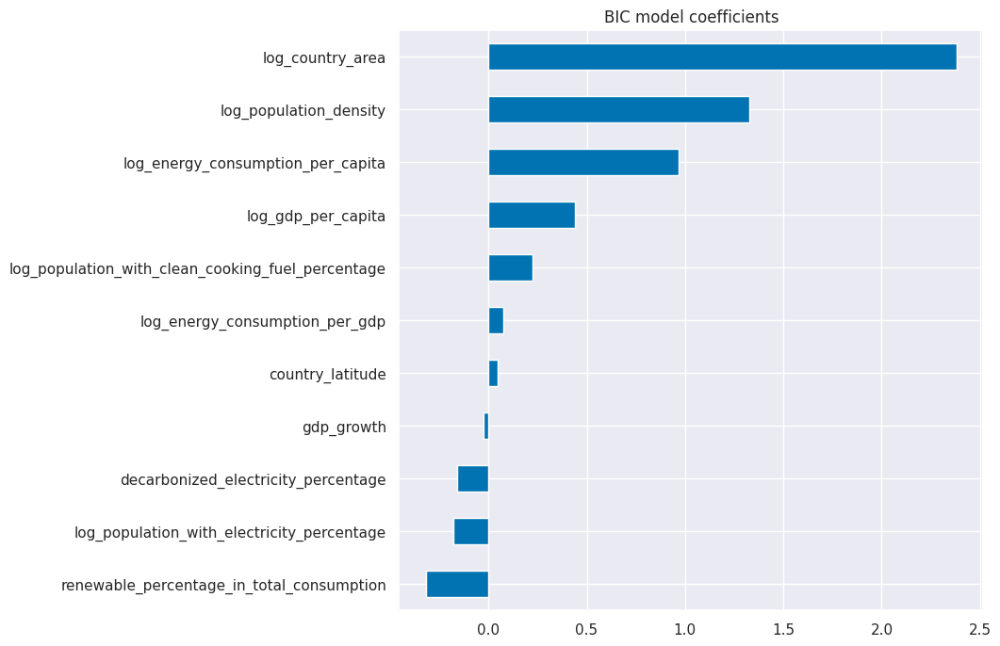

In [58]:
# Coefficients
coefs = regBIC.coef_
print(coefs)

coefs = pd.Series(coefs, index = best_vars_bic)

imp_coef = coefs.sort_values()
plt.figure(figsize=(8, 8))
imp_coef.plot(kind = "barh")
plt.title("BIC model coefficients")

### **2.2.2. Quadratic regression**

#### **Without variable selection**

--------------------------------On test set--------------------------------
MSE on log-transformed scale = 3.358e-02
R2 on log-transformed scale = 0.9945999489096728
MSE on original scale = 9.874e+09
R2 on original scale = 0.9887180990953797


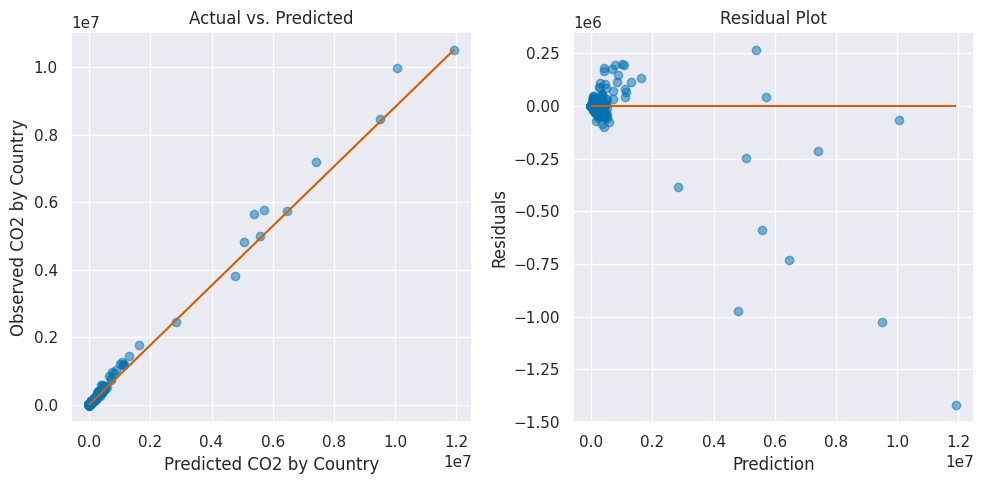

In [59]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

# Create a quadratic regression model
poly_features = PolynomialFeatures(degree=2, include_bias=True)
regQuadra = make_pipeline(poly_features, linear_model.LinearRegression())

regRidgopt, y_pred, r2_quad, mse_quad = selection_model(regQuadra, log=True)
plot_prediction(y_pred, log=True)

#### **Variable selection with regularization Lasso**

Fitting 5 folds for each of 9 candidates, totalling 45 fits
--------------------------------By cross-validation--------------------------------
Best Parameters = {'lasso__alpha': 0.0005}
Best MSE on log-transformed scale = 4.367e-02
--------------------------------On test set--------------------------------
MSE on log-transformed scale = 3.515e-02
R2 on log-transformed scale = 0.9943466671795135
MSE on original scale = 7.731e+09
R2 on original scale = 0.9911666768446502


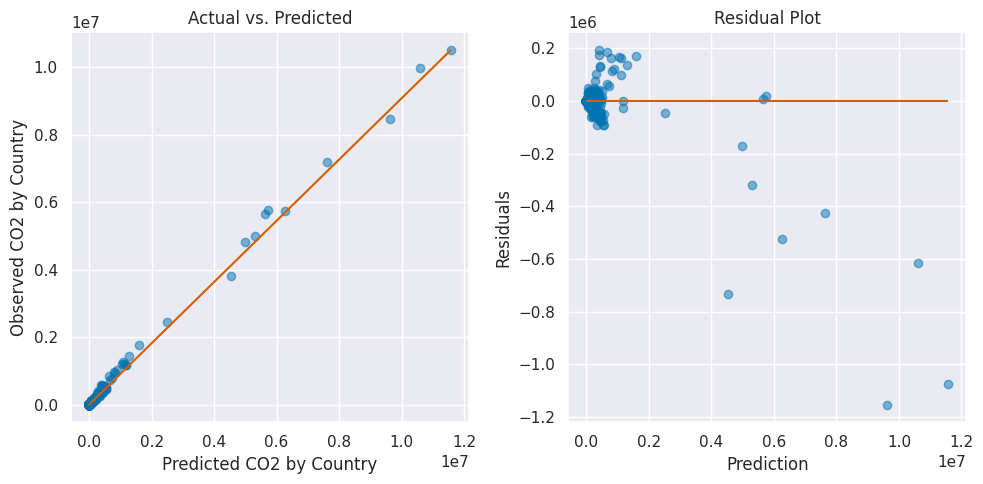

In [60]:
from sklearn.pipeline import make_pipeline
# Grid of alpha values for optimization
param_grid = {
     "lasso__alpha": [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]
}

# Create a quadratic regression model with Lasso
model = make_pipeline(poly_features, linear_model.Lasso())

# Model selection
regQuadLasso, y_pred, r2_quadLasso, mse_quadLasso = selection_model(model, param_grid=param_grid, log=True)
plot_prediction(y_pred, log =True)

Lasso preserves 333 variables and removes 297


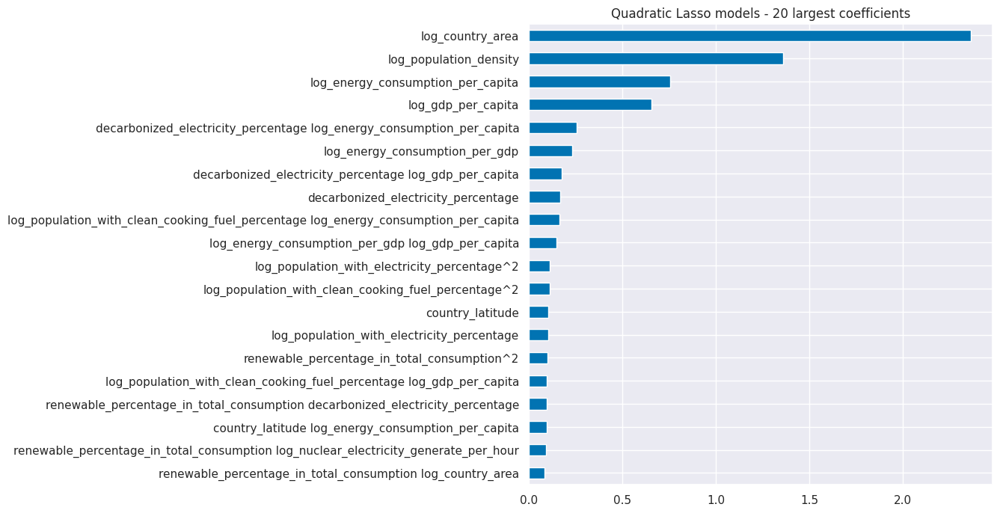

In [61]:
# Coefficients
coefs = regQuadLasso.named_steps["lasso"].coef_
#print(coefs)

poly_features.fit(X_train)
feature_names = poly_features.get_feature_names_out(X_train.columns)
coefs = pd.Series(coefs, index=feature_names)
print("Lasso preserves " + str(sum(coefs != 0)) +
       " variables and removes " + str(sum(coefs == 0)))

imp_coef = abs(coefs).sort_values()
plt.figure(figsize=(8, 8))
imp_coef.iloc[-20:].plot(kind = "barh")
plt.title("Quadratic Lasso models - 20 largest coefficients")
plt.show()

Because of the huge number of variables in `Quadratic model`, we illustrate only the most 10 important variables.

#### **Penalization with regularization Ridge**

Fitting 5 folds for each of 4 candidates, totalling 20 fits
--------------------------------By cross-validation--------------------------------
Best Parameters = {'ridge__alpha': 0.2}
Best MSE on log-transformed scale = 4.557e-02
--------------------------------On test set--------------------------------
MSE on log-transformed scale = 3.342e-02
R2 on log-transformed scale = 0.9946248731013791
MSE on original scale = 1.197e+10
R2 on original scale = 0.986328471025072


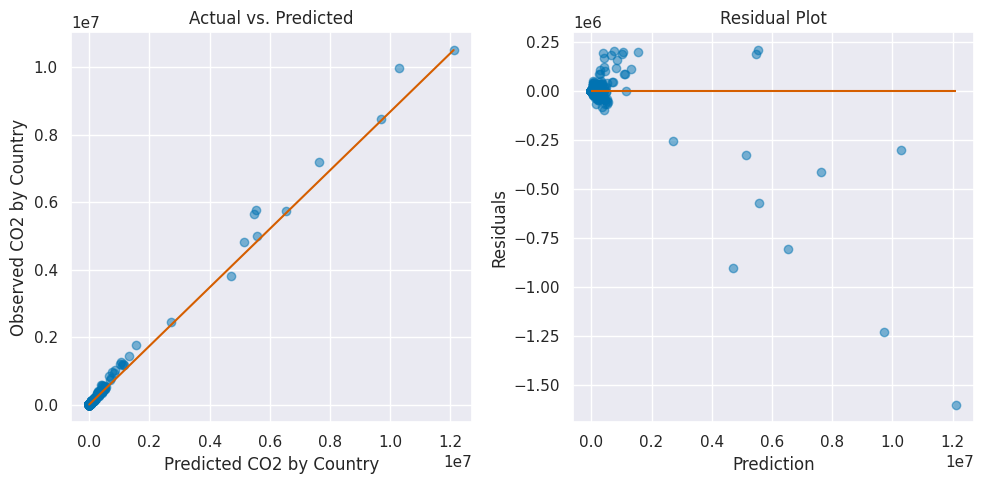

In [62]:
# Grid of alpha values for optimization
param_grid = {
     "ridge__alpha": [0.1, 0.2, 0.5, 1]
}

# Create a quadratic regression model with Lasso
model = make_pipeline(poly_features, linear_model.Ridge())

# Model selection
regQuadRidge, y_pred, r2_quadRidge, mse_quadRidge = selection_model(model, param_grid=param_grid, log=True)
plot_prediction(y_pred, log=True)

### **2.2.3. Support Vector Machine Regression**

In [63]:
from sklearn.svm import SVR

# Define the model
model = SVR()

# Define the parameter grid for SVR
param_grid = [
    {
        'kernel': ['rbf'],
        'C': [0.1, 1, 10, 100],
        'gamma': ['scale', 'auto', 0.001, 0.01, 0.1],
    },
    {
        'kernel': ['linear'],
        'C': [0.1, 1, 10, 100],
    },
    {
        'kernel': ['poly'],
        'C': [0.1, 1, 10, 100],
        'degree': [2, 3, 4, 5],
        'gamma': ['scale', 'auto', 0.001, 0.01, 0.1],
    }
]

##### **On the original target variable**

Fitting 5 folds for each of 104 candidates, totalling 520 fits
--------------------------------By cross-validation--------------------------------
Best Parameters = {'C': 100, 'degree': 5, 'gamma': 0.1, 'kernel': 'poly'}
Best MSE = 4.341e+11
--------------------------------On test set--------------------------------
MSE on test set = 5.804e+11
R2 on test set = 0.3367817193033492


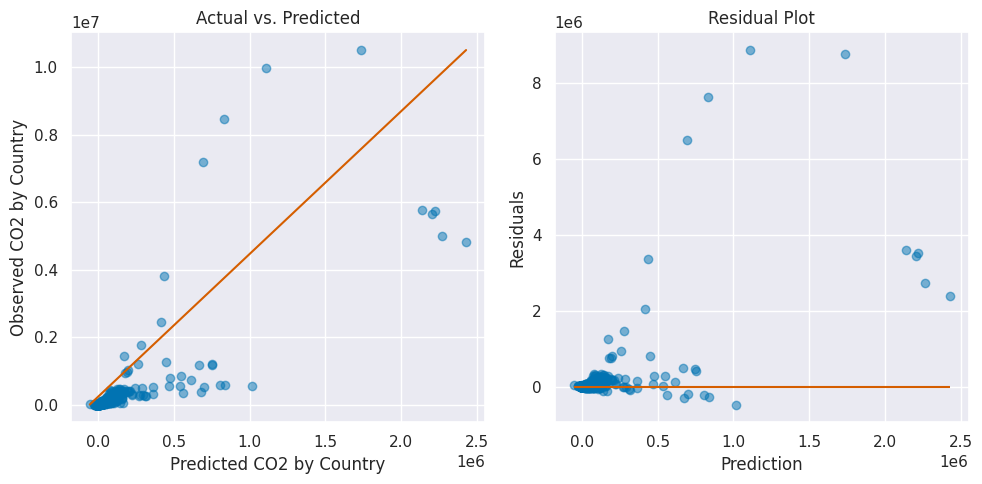

In [64]:
# Call the selection_model function
svmOpt, y_pred, r2_svmRaw, mse_svmRaw = selection_model(model, param_grid=param_grid)

# Plot the predictions
plot_prediction(y_pred)

##### **On the transformed target variable**

Fitting 5 folds for each of 104 candidates, totalling 520 fits
--------------------------------By cross-validation--------------------------------
Best Parameters = {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
Best MSE on log-transformed scale = 5.376e-02
--------------------------------On test set--------------------------------
MSE on log-transformed scale = 4.922e-02
R2 on log-transformed scale = 0.9920833207365802
MSE on original scale = 4.680e+09
R2 on original scale = 0.994652663582192


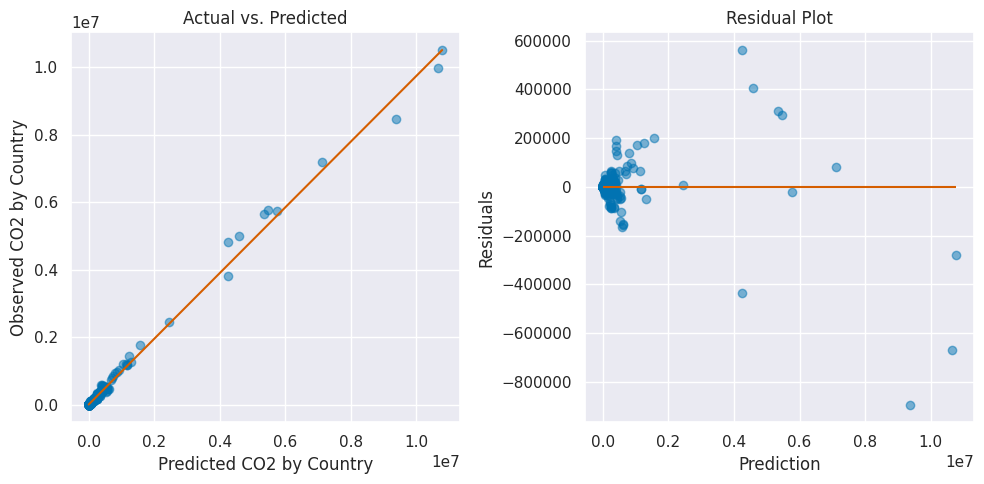

In [65]:
# Call the selection_model function
svmOpt, y_pred, r2_svm, mse_svm = selection_model(model, param_grid=param_grid, log=True)

# Plot the predictions
plot_prediction(y_pred, log=True)

**Interpretation of Results**:

- Once again, the benefits of using transformed variable are demonstrated with the SVR model. The MSE of the model with `co2_by_country` is 75 times larger than the model with `log_co2_by_country`.
- In theory, SVR model could perform better with the `co2_by_country` if we tunning parameters more carefully, however, using transform variable saved us a lot of time.
- Here to simply, we chose SVR's kernel with cross-Validation. However, we can interpret the choice of kernel **rbf**:
  - Popularity and Empirical Success: It has been empirically observed that the **rbf** kernel often performs well in a variety of practical scenarios, making it a good starting point.
  - Non-Linear Problems: The **rbf** kernel is capable of handling non-linear decision boundaries. This is particularly useful in datasets where relationships between features are not straightforward, this is exactly our case when looking at the scatter plot in the section **Bidimensional Statistics**.

### **2.2.4. Optimal tree**

- As mentioned above, although using log-transform of the target variable brings great benefits, it is only valid for some models.

- Indeed, for tree-based models, this is not only unnecessary but also has the harmful effect of changing the importance of variables due to differences in scale.

- Hence, from now on we only focus on the original target variable.

In [66]:
seed = 12

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
--------------------------------By cross-validation--------------------------------
Best Parameters = {'ccp_alpha': 0.1, 'max_depth': 32, 'min_samples_leaf': 1, 'min_samples_split': 10}
Best MSE = 3.972e+10
--------------------------------On test set--------------------------------
MSE on test set = 6.684e+09
R2 on test set = 0.9923630631624353


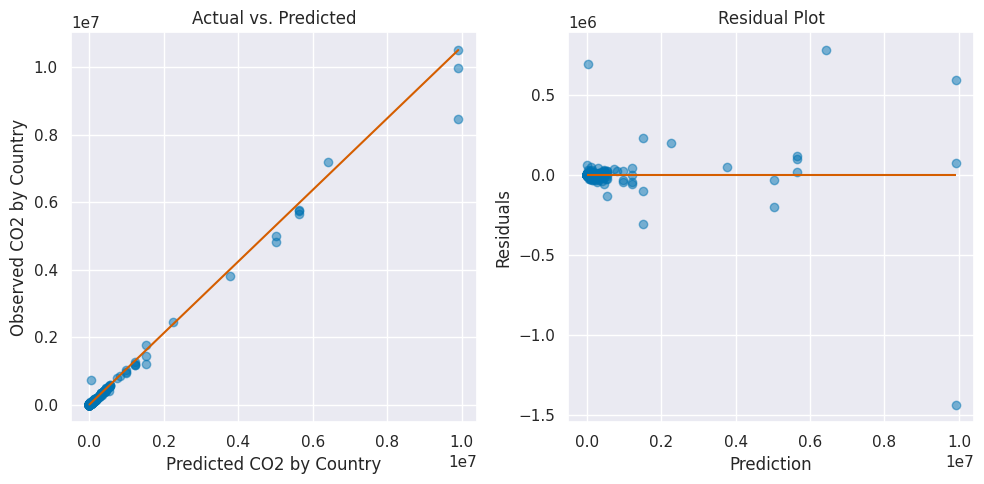

In [67]:
from sklearn.tree import DecisionTreeRegressor

# Define the model
model = DecisionTreeRegressor(random_state=seed)

# Define the parameter grid for DecisionTreeRegressor
param_grid = [
    {'max_depth': [4, 8, 16, 32, 64, None],
     'min_samples_split': [2, 10, 20],
     'min_samples_leaf': [1, 5, 10],
    'ccp_alpha': [0.0, 0.001, 0.01, 0.1]}  # Complexity parameter for Minimal Cost-Complexity Pruning
]

# Call the selection_model function
treeOpt, y_pred, r2_tree, mse_tree = selection_model(model,param_grid=param_grid)

# Plot the predictions
plot_prediction(y_pred)

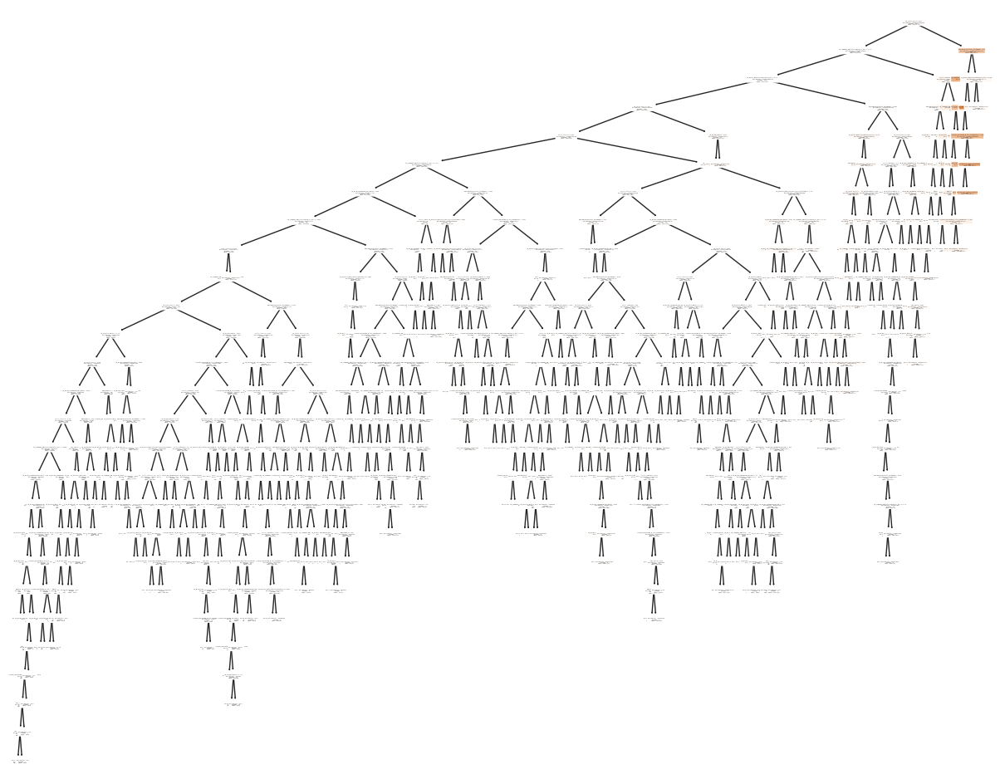

In [68]:
from sklearn.tree import plot_tree
plt.figure(figsize=(15,12))

plot_tree(treeOpt,feature_names=X.columns.tolist(), rounded=True,filled = True)
plt.show()

The function `plot_feature_importance` is designed to visualize the feature importance of a model in a bar plot. This function works well for models that provide feature importance, such as RandomForestRegressor, GradientBoostingRegressor, and other tree-based models.

In [69]:
def plot_feature_importance(importance,names,model_type):
    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + 'FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

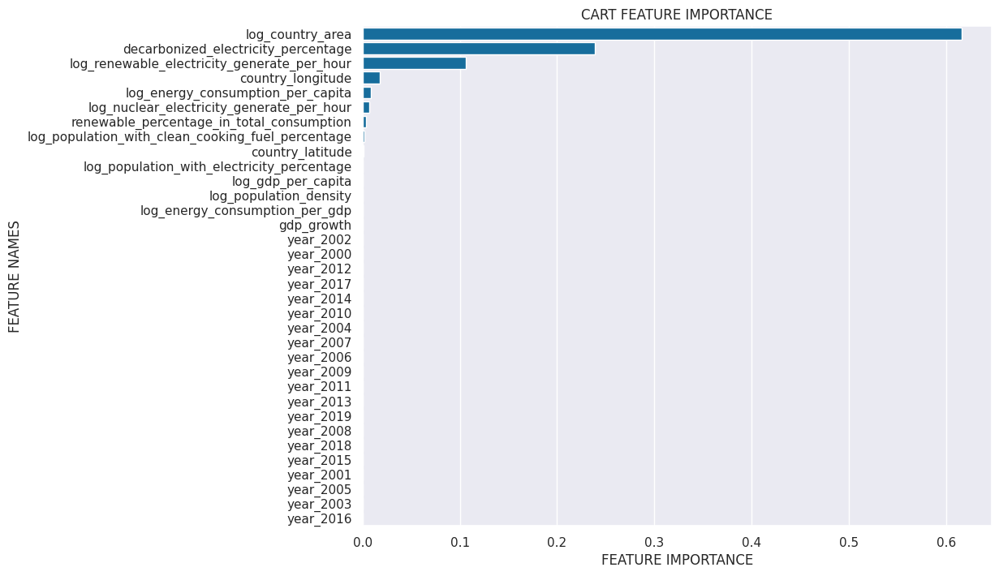

In [70]:
plot_feature_importance(treeOpt.feature_importances_,X.columns,'CART ')

### **2.2.5. Random forest**

In [71]:
from sklearn.ensemble import RandomForestRegressor

# Define the model
model = RandomForestRegressor(random_state=seed)

# Define the parameter grid for RandomForestRegressor
param_grid = [
    {'n_estimators': [100, 200, 500],
     'max_depth': [4, 8, 16, 32],
     'min_samples_split': [2, 5, 10],
     'min_samples_leaf': [1, 2, 4]}
]

# Assuming X_train, y_train, X_test, y_test are already defined and scaled
# Call the selection_model function
rfOpt, y_pred, r2_rf, mse_rf = selection_model(model, param_grid=param_grid)

# Plot the predictions
plot_prediction(y_pred)


Fitting 5 folds for each of 108 candidates, totalling 540 fits


KeyboardInterrupt: 

In [ ]:
plot_feature_importance(rfOpt.feature_importances_,X.columns,'RANDOM FOREST ')

### **2.2.6. Boosting algorithm**

#### **Gradient Boosting Models**

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Define the model
model = GradientBoostingRegressor(random_state=seed)

# Define the parameter grid for GradientBoostingRegressor
param_grid = [
    {'n_estimators': [100, 200, 500],
     'learning_rate': [0.01, 0.1, 0.2],
     'max_depth': [4, 8, 16, 32]}
]

# Call the selection_model function
boostingOpt, y_pred, r2_gbm, mse_gbm = selection_model(model, param_grid=param_grid)

# Plot the predictions
plot_prediction(y_pred)


In [ ]:
plot_feature_importance(boostingOpt.feature_importances_,X.columns,'GRADIENT BOOSTING ')

#### **AdaBoost**

In [ ]:
from sklearn.ensemble import AdaBoostRegressor

# Define the model
model = AdaBoostRegressor(estimator=DecisionTreeRegressor(), random_state=seed)

# Define the parameter grid for AdaBoostRegressor
param_grid = [
    {'n_estimators': [50, 100, 200],
     'learning_rate': [0.01, 0.1, 1.0],
     'estimator__max_depth': [4, 8, 16, 32]}
]

# Call the selection_model function
adaBoostOpt, y_pred, r2_ada, mse_ada = selection_model(model, param_grid=param_grid)

# Plot the predictions
plot_prediction(y_pred)


In [ ]:
plot_feature_importance(adaBoostOpt .feature_importances_,X.columns,'ADABOOST ')

#### **Extreme Gradient Boosting (XGBoost)**

In [ ]:
import xgboost as xgb

# Define the model
model = xgb.XGBRegressor(random_state=seed)

# Define the parameter grid for XGBRegressor
param_grid = [
    {'n_estimators': [100, 200, 500],
     'learning_rate': [0.01, 0.1, 0.2],
     'max_depth': [4, 8, 16, 32],
    'gamma': [0, 0.1, 0.2],
    'min_child_weight': [1, 3]}
]

# Call the selection_model function
xgbOpt, y_pred, r2_xgb, mse_xgb = selection_model(model, param_grid=param_grid)

# Plot the predictions
plot_prediction(y_pred)


In [ ]:
plot_feature_importance(xgbOpt.feature_importances_,X.columns,'XGBOOST ')

### **2.2.7. Neural networks with `Scikit-Learn`**

In [ ]:
from sklearn.neural_network import MLPRegressor

# Define the parameter grid for MLPRegressor
param_grid = {
    'hidden_layer_sizes': [(50,50,50), (50,100), (100,)],
    'alpha': [0.0001, 0.05],
    'activation': ['tanh', 'relu'],
    'learning_rate': ['constant','adaptive']
}

# Create the MLPRegressor
model = MLPRegressor(max_iter=2000, random_state=seed)

# Call the selection_model function
nnetOpt, y_pred, r2_nn, mse_nn = selection_model(model, param_grid=param_grid)

# Plot the predictions
plot_prediction(y_pred)

### **2.2.8. Table of Results**

The results of **Linear Regression**, **Quadratic Regression** or **SVR** on the original target variable are hundreds of times worse than other methods. So we use the results on the transformed target variable to facilitate comparison.

This again highlights the benefits of **log-transformation**, which help simple models have comparable performance to more complex models.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

models = ['LinearRegression', 'LinearLasso', 'LinearRidge', 'LinearAIC', 'LinearBIC',
          'QuadraticRegression', 'QuadraticLasso', 'QuadraticRidge', 'SVR', 'DecisionTree',
          'RandomForest', 'GradientBoosting', 'AdaBoost', 'XGBoost', 'NeuralNetwork']

mse_values = [mse_reg, mse_Lasso, mse_Ridge, mse_aic, mse_bic, mse_quad, mse_quadLasso, mse_quadRidge,
              mse_svm, mse_tree, mse_rf, mse_gbm, mse_ada, mse_xgb, mse_nn]

r2_values = [r2_reg, r2_Lasso, r2_Ridge, r2_aic, r2_bic, r2_quad, r2_quadLasso, r2_quadRidge,
             r2_svm, r2_tree, r2_rf, r2_gbm, r2_ada, r2_xgb, r2_nn]

# Tạo DataFrame
df = pd.DataFrame({
    'Model': models,
    'MSE': mse_values,
    'R2': r2_values
})

print(df)

fig, axes = plt.subplots(2, 1, figsize=(14, 12))

df.plot(kind='bar', x='Model', y='MSE', ax=axes[0], color='skyblue', legend=False)
axes[0].set_title('Mean Squared Error (MSE) of Models')
axes[0].set_ylabel('MSE')
axes[0].set_xlabel('Model')
axes[0].set_xticklabels(df['Model'], rotation=45)

df.plot(kind='bar', x='Model', y='R2', ax=axes[1], color='lightgreen', legend=False)
axes[1].set_title('$R^2$ Score of Models')
axes[1].set_ylabel('$R^2$')
axes[1].set_xlabel('Model')
axes[1].set_ylim([0.98, 1.0])
axes[1].set_xticklabels(df['Model'], rotation=45)

plt.tight_layout()
plt.show()

**Results**: After running the models for the first time, we have the following results:

- Among the linear models, the best performing model is the model with variable selection by BIC.

- However, its result is 7 times worse than our best model, Random Forest, according to MSE criteria.

## **2.3. Comparison the models**

### **Selection model function**

We make a small editing of the function `selection_model` to fit this section.

In [ ]:
def selection_model(model, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test, param_grid = None, log = False):
    """
    Fits a model using training data and evaluates it on a test set.

    Args:
    - model: The machine learning model to be used.
    - X_train, y_train: Training data features and target.
    - X_test, y_test: Test data features and target.
    - param_grid: List of tunning parameters
    - log (bool): Whether to use logarithmic transformation on the target variable.

    Returns:
    - mse: Mean squared error
    """
    if log:
        y_train = np.log1p(y_train)
        y_test = np.log1p(y_test)

    grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose=0, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)

    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)

    if log:
        mse = mean_squared_error(np.expm1(y_test), np.expm1(y_pred))

    return mse

### **Monte-Carlo cross-validation**

In [ ]:
from joblib import Parallel, delayed
import time
from sklearn.utils import check_random_state

check_random_state(12)
tps0 = time.perf_counter()

quadLasso = make_pipeline(poly_features, linear_model.Lasso())
svr = SVR()
tree = DecisionTreeRegressor()
rf = RandomForestRegressor(n_estimators=100)
gbm = GradientBoostingRegressor()
ada = AdaBoostRegressor(estimator=DecisionTreeRegressor())
nnet = MLPRegressor(max_iter=1000)

B = 10

listMethGrid = [
    [quadLasso, [{"lasso__alpha": [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]}]],
    [svr, [{'kernel': ['rbf'], 'C': [0.1, 1, 10, 100], 'gamma': [0.001, 0.01, 0.1]},
           {'kernel': ['linear'], 'C': [0.1, 1, 10, 100]},
           {'kernel': ['poly'], 'C': [0.1, 1, 10, 100], 'degree': [2, 3, 4, 5], 'gamma': [0.001, 0.01, 0.1]}]],
    [tree, [{'max_depth': [4, 8, 16, 32, 64, None], 'min_samples_split': [2, 10, 20], 'min_samples_leaf': [1, 5, 10], 'ccp_alpha': [0.0, 0.001, 0.01, 0.1]}]],
    [rf, [{'max_depth': [4, 8, 16, 32], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}]],
    [gbm, [{'n_estimators': [100, 200, 500], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [4, 8, 16, 32]}]],
    [ada, [{'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1.0], 'estimator__max_depth': [4, 8, 16, 32]}]],
    [nnet, [{'hidden_layer_sizes': [(50,50,50), (50,100), (100,)], 'alpha': [0.0001, 0.05], 'activation': ['tanh', 'relu'], 'learning_rate': ['constant','adaptive']}]]
]

arrayError = np.empty((B, len(listMethGrid)))

def process_method(method, grid_list, X_train, y_train, X_test, y_test):
    if method != quadLasso and method != svr:
        mse = selection_model(method, grid_list, log=True)
    else:
        mse = selection_model(method, grid_list)
    return mse

def process_iteration(i):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Optimize each method in parallel and calculate the error on the test set
    errors = Parallel(n_jobs=-1, verbose=0)(
        delayed(process_method)(method, grid_list, X_train, y_train, X_test, y_test)
        for method, grid_list in listMethGrid
    )
    return errors

# Use Parallel and delayed from joblib to run loops in parallel
results = Parallel(n_jobs=-1, verbose=0)(delayed(process_iteration)(i) for i in range(B))

arrayError = np.array(results)

tps1 = time.perf_counter()
print("Execution time in mins:", (tps1 - tps0) / 60)

dataframeError = pd.DataFrame(arrayError, columns=['QuadraticLasso', 'SVR', 'DecisionTree', 'RandomForest', 'GradientBoosting', 'AdaBoost', 'NeuralNetwork'])
print(dataframeError)

In [ ]:
dataframeError[['DecisionTree', 'RandomForest', 'GradientBoosting', 'AdaBoost']].boxplot(return_type='dict')
plt.show()

In [ ]:
dataframeError.mean()

## **2.4. Feedback on EDA**

We gather all the bar-plots about the features' coefficient or the features' importance.

In [ ]:
plt.figure(figsize=(10, 32))

# Lasso coefficients
coefs = regLasso.coef_
coefs = pd.Series(coefs, index=X.columns)
imp_coef = coefs.sort_values()
plt.subplot(4, 1, 1)
imp_coef.plot(kind="barh")
plt.title("Lasso model coefficients")

# AIC model coefficients
coefs = regAIC.coef_
coefs = pd.Series(coefs, index=best_vars_aic)
imp_coef = coefs.sort_values()
plt.subplot(4, 1, 2)
imp_coef.plot(kind="barh")
plt.title("AIC model coefficients")

# BIC model coefficients
coefs = regBIC.coef_
coefs = pd.Series(coefs, index=best_vars_bic)
imp_coef = coefs.sort_values()
plt.subplot(4, 1, 3)
imp_coef.plot(kind="barh")
plt.title("BIC model coefficients")

# Quadratic Lasso coefficients
coefs = regQuadLasso.named_steps["lasso"].coef_
poly_features.fit(X_train)
feature_names = poly_features.get_feature_names_out(X.columns)
coefs = pd.Series(coefs, index=feature_names)
imp_coef = abs(coefs).sort_values()
plt.subplot(4, 1, 4)
imp_coef.iloc[-20:].plot(kind = "barh")
plt.title("Quadratic Lasso models - 20 largest coefficients")


# Feature importance plots
plot_feature_importance(treeOpt.feature_importances_, X.columns, 'CART ')

plot_feature_importance(rfOpt.feature_importances_, X.columns, 'RANDOM FOREST ')

plot_feature_importance(boostingOpt.feature_importances_, X.columns, 'GRADIENT BOOSTING ')

plot_feature_importance(adaBoostOpt.feature_importances_, X.columns, 'ADABOOST ')

plot_feature_importance(xgbOpt.feature_importances_, X.columns, 'XGBOOST ')

plt.show()

**Result Comments**:

- The `year` variables have very little influence on the prediction results.
- In all models, `log_country_area` variable always plays the most important role, moreover:
  - In Lasso, AIC, BIC, and Quadratic Lasso models, `log_country_area`, `log_population_density` and `log_energy_consumpion_per_capita` are top 3 most important variables.
  - In CART, RF, GBM, AdaBoost, and XGBoost, `log_country_area`, `log_renewable_electricity_generated_per_hour` and `decarbonized_electricity_percentage` are top 3 most important variables.
- From these analysis, we can deduce the evaluation criteria of different models, in addition to the **country's area**:
  - Linear and quadratic regression models tend to predict according to the **country's population**.
  - Tree-based models tend to predict according to the **country's electricity production level**.

**Back to EDA**: this time we show the 10 countries with the largest $CO_2$ emissions. This result is consistent with our previous analysis. Indeed, the countries in the top 10 countries with the highest $CO_2$ emissions all satisfy at least one of the following three criteria:

- Large area
- Dense population
- Developed power production level

In particular, two countries that satisfy all three criteria above, **China** and **the United States**, have an amount of $CO_2$ emitted each year that exceeds the rest.

In [ ]:
# Take out the 10 countries with the highest average emissions
top_10_co2_emitters = avg_co2_by_country.head(10)

# Visualize
plt.figure(figsize=(10, 6))
top_10_co2_emitters.plot(kind='bar')
plt.title('Top 10 CO2 Emitters by Country')
plt.ylabel('Average CO2 Emissions (kT)')
plt.xlabel('Country')
plt.xticks(rotation=45)
plt.show()

## **2.5. Data Imputation**

### **Imputation**

In theory, the **XGBoost** model can handle data with NaN values, but we still have NaN values in the target variable `co2_by_country`. The target variable cannot contain NaN or infinite values. Hence, we need to clean or impute our data in all cases.

In [ ]:
df_raw.info()

In [ ]:
df_transformed = df_raw.copy()

# List of variables to transform
variables_to_transform = [
    'population_with_electricity_percentage',
    'population_with_clean_cooking_fuel_percentage',
    'nuclear_electricity_generate_per_hour',
    'renewable_electricity_generate_per_hour',
    'energy_consumption_per_capita',
    'energy_consumption_per_gdp',
    'gdp_per_capita',
    'population_density',
    'country_area'
]

# Apply log transformation to the right-skewed variables
# Adding a small constant (1) to avoid log(0)
for variable in variables_to_transform:
    if variable.endswith('percentage'):
        df_transformed[f'log_{variable}'] = (df_transformed[variable]).map(lambda x: np.log(100-x+0.1))
    else:
        df_transformed[f'log_{variable}'] = (df_transformed[variable]).map(lambda x: np.log(x+1))
    # Drop the original variable
    df_transformed.drop(columns=variable, inplace=True)

df_transformed.head()

In [ ]:
onehot_encoded_years=pd.get_dummies(df_transformed['reported_year'], prefix='year', dtype='int64')
quantitative_variables = df_transformed.select_dtypes(include=['float64']).columns
df_modelised = pd.concat([onehot_encoded_years,df_transformed[quantitative_variables]],axis=1)

In this part, we implement three main imputation strategies: mean, KNN, and MissForest.

**Note**:

- The biggest difficulty is compatibility with the **missingpy** library.
- The current **missingpy** library is version 0.2.0, which is not compatible with the **Scikit-Learn** library version 1.2.2 that we are using.
- We tested and found that the **Scikit-Learn** library version 1.1.2 with some adjustments, consistent with the **missingpy** library 0.2.0.
- We encourage the use of **Google Colab** or other cloud computing services to facilitate changing library versions

In [ ]:
#!pip install missingpy

In [ ]:
import sys
import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base

In [ ]:
#!pip uninstall scikit-learn
#!pip install scikit-learn==1.1.2

In [ ]:
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer
from missingpy import MissForest


# Mean Imputation
df_mean_imputed = df_modelised.apply(lambda x: x.fillna(x.mean()), axis=0)

# KNN Imputation
knn_imputer = KNNImputer(n_neighbors=5)
df_knn_imputed = df_modelised.copy()
df_knn_imputed[:] = knn_imputer.fit_transform(df_knn_imputed)

# missForest Imputation
missforest_imputer = MissForest()
df_missforest_imputed = df_modelised.copy()
df_missforest_imputed[:] = missforest_imputer.fit_transform(df_missforest_imputed)

In [ ]:
print("Mean Imputed DataFrame:\n", df_mean_imputed.info())

In [ ]:
print("KNN Imputed DataFrame:\n", df_knn_imputed.info())

In [ ]:
print("missForest Imputed DataFrame:\n", df_missforest_imputed.info())

### **Prediction**

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor

tree = DecisionTreeRegressor()
ada = AdaBoostRegressor(base_estimator=DecisionTreeRegressor())

listMethGrid = [
    [tree, [{'max_depth': [4, 8, 16, 32, 64, None], 'min_samples_split': [2, 10, 20], 'min_samples_leaf': [1, 5, 10], 'ccp_alpha': [0.0, 0.001, 0.01, 0.1]}]]
    #,[ada, [{'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1.0], 'base_estimator__max_depth': [4, 8, 16, 32]}]]
]

In [ ]:
# Define a function to process and evaluate each DataFrame
def process_and_evaluate(df, strategy_name, listMethGrid):
    # Split features and target variable
    X = df.drop(columns='co2_by_country')
    y = df['co2_by_country']

    # Split data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=28)

    # Standardize the features
    ss = StandardScaler()
    ss.fit(X_train)
    X_train = ss.transform(X_train)
    X_train = pd.DataFrame(X_train, columns=X.columns)
    X_test = ss.transform(X_test)
    X_test = pd.DataFrame(X_test, columns=X.columns)
    for method, param_grid in listMethGrid:
        mse = selection_model(model=method,param_grid=param_grid)
    return mse

# Evaluate each imputed DataFrame
results = {}
results['mean'] = process_and_evaluate(df_mean_imputed, 'mean', listMethGrid)
results['knn'] = process_and_evaluate(df_knn_imputed, 'knn', listMethGrid)
results['missforest'] = process_and_evaluate(df_missforest_imputed, 'missforest', listMethGrid)

In [ ]:
# Display results
for strategy, mse in results.items():
    print(f'Imputation Strategy: {strategy}, Mean Squared Error: {mse:.3e}')